In [ ]:
# !pip install gingado fredapi umap ruptures hdbscan shap torch WordCloud scikit-network keybert
# !pip install tiktoken openai transformers sentence_transformers ctransformers bertopic vertexai sentencepiece

# !pip install -U 'spacy[apple]'
# # !pip install -U 'spacy[cuda12x]'

# # !pip install numpy==2.1.3 --force-reinstall --no-cache-dir

In [2]:
import os
from dotenv import load_dotenv; load_dotenv()

from cdm.helpers import spacy as spacy_helpers
from cdm.helpers.openai_api import OPENAI_CLIENT, OpenAIEmbedding
from cdm.helpers.openai_api import chat_completion as openai_chat
from cdm.helpers.google_ai_api import GGENAI_CLIENT, GoogleAIEmbedding, AdvancedGoogleAIEmbedding
from cdm.helpers.google_ai_api import chat_completion as gemini_chat

from tqdm.notebook import tqdm
from numba import njit
import json
import pandas as pd
import numpy as np
from numpy.linalg import eig
import numpy.typing as npt
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.lines as mlines
from matplotlib.colors import LinearSegmentedColormap
from wordcloud import WordCloud
import matplotlib.dates as mdates
import pickle
from IPython.display import display
from collections import defaultdict, Counter
from itertools import chain

from gingado.datasets import load_CB_speeches
from fredapi import Fred

from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler, Normalizer
from sklearn.decomposition import PCA
import umap
from umap import UMAP
import ruptures as rpt
from hdbscan import HDBSCAN
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

import re
import unicodedata
os.environ["PYTORCH_MPS_HIGH_WATERMARK_RATIO"] = "0.0"
import torch
import gc
import spacy; spacy.prefer_gpu()
import tiktoken
from vertexai.preview import tokenization
from transformers import pipeline, AutoTokenizer, AutoModel, AutoModelForTokenClassification
from ctransformers import AutoModelForCausalLM
from sentence_transformers import SentenceTransformer
from bertopic import BERTopic
from bertopic.representation._openai import OpenAI as BertOpenAI
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

from bertopic.representation import TextGeneration
from bertopic.representation import KeyBERTInspired
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.representation import PartOfSpeech
from bertopic.representation import MaximalMarginalRelevance
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from bertopic.vectorizers import OnlineCountVectorizer
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import TSNE

from scipy.spatial.distance import euclidean#, cosine
from sklearn.metrics.pairwise import cosine_similarity as cosine

import networkx as nx
from sknetwork.clustering import Leiden
from scipy.sparse import csr_matrix
from scipy.sparse import lil_matrix
from scipy.sparse import block_diag, hstack, vstack
from sklearn.neighbors import kneighbors_graph
from keybert import KeyBERT
from transformers.pipelines import pipeline

ModuleNotFoundError: No module named 'cdm'

In [8]:
FRED_API = os.getenv("FRED_API_KEY")
DEVICE = torch.device("mps")
STOP_WORDS = list(ENGLISH_STOP_WORDS)
RANDOM_STATE = 42

START_DATE = '1996-01-01'
END_DATE = '2025-05-01'

# Transformer Narrative Polarity Fields: Capturing Multidimensional Semantic Shifts with TOPOL

**Abstract**:
In computational linguistics, semantic polarity has traditionally been referred to sentiment expressed along a scalar continuum. However, language polarity is multidimensional, as semantic spaces are as direction-rich as perspectives of discourse captured in a given narrative context. We here introduce an unsupervised computational framework for capturing the multidimensionality of semantic polarity by reconstructing and explaining topic-shift transformer vector polarity fields. We model discourse evolution as vector displacements in semantic transformer embedding spaces, and reconstruct narrative polarity vectors on top of state-of-the-art topic modeling extracted manifolds. These polarity vectors both capture the narrative polarity field of the discourse, that could be or not sentiment-aligned, and are able to represent the direction and magnitude of semantic change across a contextual boundary defining the polarity-relevant narrative dimension. We apply this computational framework to the mapping and detection of central bank speech narrative fields and shifts that occur at macroeconomic regime changes. This robust unsupervised framework constitutes the first computational formulation for reconstructing polarity vector fields and mapping the multidimensional dynamics of narrative polarity semantic spaces.

# Helpers

In [9]:
# Randomness

import os, struct
seed = struct.unpack("I", os.urandom(4))[0]
print(f"Random seed: {seed}")

import requests
r = requests.get("https://www.random.org/cgi-bin/randbyte?nbytes=4&format=h")
seed = int(r.text.strip().replace(" ", ""), 16)
print(f"Random seed: {seed}")

from scipy.stats.qmc import Halton
n = 1
halton = Halton(d=1)
seeds = (halton.random(n) * 1e8).astype(int).flatten()
print(f"Random seed: {seeds[0]}")

Random seed: 3517485043
Random seed: 3158273652
Random seed: 95750745


In [168]:
BLOOM_YELLOW = "#ffa028"
def bloomberg_plot(Xs: list, Ys: list, list_of_labels: list, 
                        title: str = "", x_label: str = "", y_label: str = "",
                        h_lines: list = None,
                        v_lines: list = None,
                        fig_size=(15, 6), show_last_val=False):

    assert (len(Xs) == len(Ys)) or (len(Xs) == 1), "Xs and Ys must have the same length"
    assert len(Ys) == len(list_of_labels), "Xs and Ys must have the same length as list_of_labels"
    assert len(Ys) <= 10, "Maximum 10 lines supported"

    # Bloomberg-like colors
    bloomberg_line_colors = [
        "#1f77b4",  # Deep blue
        "#d62728",  # Red
         "#2ca02c",  # Green
         "#ff7f0e",  # Orange
        "#9467bd",  # Purple
        "#e377c2",  # Pink
        "#17becf",   # Cyan
        "#8c564b",  # Brown
        "#bcbd22",  # Yellow-green
        "#7f7f7f",  # Gray
    ]
    bg_color = "#111111"  # Bloomberg dark background
    # bg_color = "#FFFFFF"    # Bloomberg light background
    grid_color = "#444444"
    label_color = "#DDDDDD"

    plt.style.use("default")
    fig, ax = plt.subplots(figsize=fig_size, facecolor=bg_color)
    ax.set_facecolor(bg_color)

    # Horizontal lines
    if h_lines is not None:
        for h_line in h_lines:
            ax.axhline(y=h_line, color=BLOOM_YELLOW, linestyle=':', linewidth=1)
    # Vertical lines
    if v_lines is not None:
        for i in range(len(v_lines)):
            v_line = v_lines[i]
            ax.axvline(x=v_line, color=BLOOM_YELLOW, linestyle=':', linewidth=1)

    # Plot lines
    if len(Ys) == 1:
        lw = 1
        color = "white"
        X, Y, label = Xs[0], Ys[0], list_of_labels[0]
        ax.plot(X, Y, label=label, color=color, linewidth=lw)
        plt.fill_between(X, Y, alpha=1, color="#022953")
        if show_last_val:
            last_x = X[-1]
            last_y = Y[-1]
            ax.annotate(f"{last_y:.2f}", xy=(last_x, last_y), xytext=(5, 0),
                        textcoords='offset points', va='center', ha='left',
                        color=bg_color, fontsize=12, fontweight='bold',
                        bbox=dict(facecolor=color, edgecolor=color, boxstyle='round,pad=0.2'))
    else:
        lw = 1.5
        fill_alpha = 0.1
        for i, (Y, label, color) in enumerate(zip(Ys, list_of_labels, bloomberg_line_colors)):
            if len(Xs) == 1: X = Xs[0]
            else: X = Xs[i]
            ax.plot(X, Y, label=label, color=color, linewidth=lw)
            plt.fill_between(X, Y, alpha=fill_alpha, color=color)

            if show_last_val:
                last_x = X[-1]
                last_y = Y[-1]
                ax.annotate(f"{last_y:.2f}", xy=(last_x, last_y), xytext=(5, 0),
                            textcoords='offset points', va='center', ha='left',
                            color=bg_color, fontsize=12, fontweight='bold',
                            bbox=dict(facecolor=color, edgecolor=color, boxstyle='round,pad=0.2'))
                
    # Grid
    ax.grid(True, linestyle="--", linewidth=0.8, color=grid_color, which='major')

    # Ticks and Labels
    ax.tick_params(colors=label_color, labelsize=12)
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color(grid_color)
    ax.spines['bottom'].set_color(grid_color)

    ax.set_xlabel(x_label, fontsize=13, color=label_color)
    ax.set_ylabel(y_label, fontsize=13, color=label_color)
    # Put y axis on the right
    ax.yaxis.tick_right()
    ax.yaxis.set_label_position("right")
    ax.set_title(title, fontsize=16, color='white', pad=20)

    # Legend
    legend = ax.legend(frameon=True, fontsize=12, loc='upper left', facecolor=bg_color, edgecolor=grid_color)
    for text in legend.get_texts():
        text.set_color(label_color)

    plt.tight_layout()

    return fig, ax

In [25]:
def softmax(x, T=1):
    x = x / T
    return np.exp(x) / np.sum(np.exp(x))

In [26]:
def sigmoid(p1, p0, k):
    return 1 / ( 1 + np.exp( -k * (p1 - p0) ) )

In [27]:
def _clean_mps_cache():
    gc.collect()
    if torch.backends.mps.is_available():
        torch.mps.empty_cache()

---
---
---

# Macroeconomic data

**Including:** FED Fund Rates, CPI, PPI, GDP, Unemployment, Nonfarm payrolls

### Getting the data

In [28]:
fred = Fred(api_key=FRED_API)

def load_data(start: str, end: str):
    
    start_date = pd.to_datetime(start)
    end_date = pd.to_datetime('today') if end is None else pd.to_datetime(end)
    if start_date > end_date:
        raise ValueError("Start date must be before end date.")
    
    start_refined = start_date.strftime('%m/%d/%Y')
    end_refined = end_date.strftime('%m/%d/%Y')

    fedrates = fred.get_series('FEDFUNDS', start_refined, end_refined)  # Federal Funds Rate from FRED
    fedrates.name = 'FED Funds Rate'

    cpi = fred.get_series('CPIAUCNS', start_refined, end_refined)  # CPI from FRED
    cpi.name = 'CPI'

    ppi = fred.get_series('PPIACO', start_refined, end_refined)  # PPI from FRED
    ppi.name = 'PPI'

    gdp = fred.get_series('GDP', start_refined, end_refined)  # GDP from FRED
    gdp.name = 'GDP'

    unemployment = fred.get_series('UNRATE', start_refined, end_refined)  # Unemployment from FRED
    unemployment.name = 'Unemployment'

    nfp = fred.get_series('PAYEMS', start_refined, end_refined)  # Nonfarm Payrolls from FRED
    nfp.name = 'Nonfarm Payrolls'

    df = pd.concat([fedrates, cpi, ppi, gdp, unemployment, nfp], axis=1)
    df = df.ffill()

    return df

In [29]:
fpath = f'data/macrodata_{START_DATE}_{END_DATE}.csv'
if not os.path.exists(fpath):
    print(f"File not found: {fpath}")
    print("Downloading the macroeconomic data...")
    macrodata = load_data(START_DATE, END_DATE)
    macrodata['date'] = pd.to_datetime(macrodata.index)
    macrodata = macrodata.reset_index(drop=True)
    macrodata.to_csv(fpath, index=False)
    print(f"Found {len(macrodata)} data points, saved and loaded.")
else:
    print(f"File found: {fpath}")
    print("Loading the dataset...")
    macrodata = pd.read_csv(fpath, parse_dates=['date'])
    print(f"Found {len(macrodata)} data points, loaded.")

File found: data/macrodata_1996-01-01_2025-05-01.csv
Loading the dataset...
Found 352 data points, loaded.


In [30]:
macrodata_cp = macrodata.copy().dropna()
macrodata_cp = macrodata_cp.set_index('date')

macrodata_returns = macrodata_cp.pct_change()

### Scaling data for further analysis

In [31]:
def rolling_window_scaling(data, window_size=12, scaler=StandardScaler()):
    scaled_data = []
    # for i in range(window_size, len(data)):
    for i in range(len(data)):
        if i < window_size:
            scaled_data.append([np.nan] * data.shape[1])
            continue
        idx = i + 1
        window_data = data[idx - window_size : idx]
        assert len(window_data) == window_size
        scaled_window = scaler.fit_transform(window_data)
        scaled_data.append(list(scaled_window[-1]))
    return np.array(scaled_data)

<Axes: title={'center': 'Scaled Macroeconomic Data (rolling window)'}, xlabel='date'>

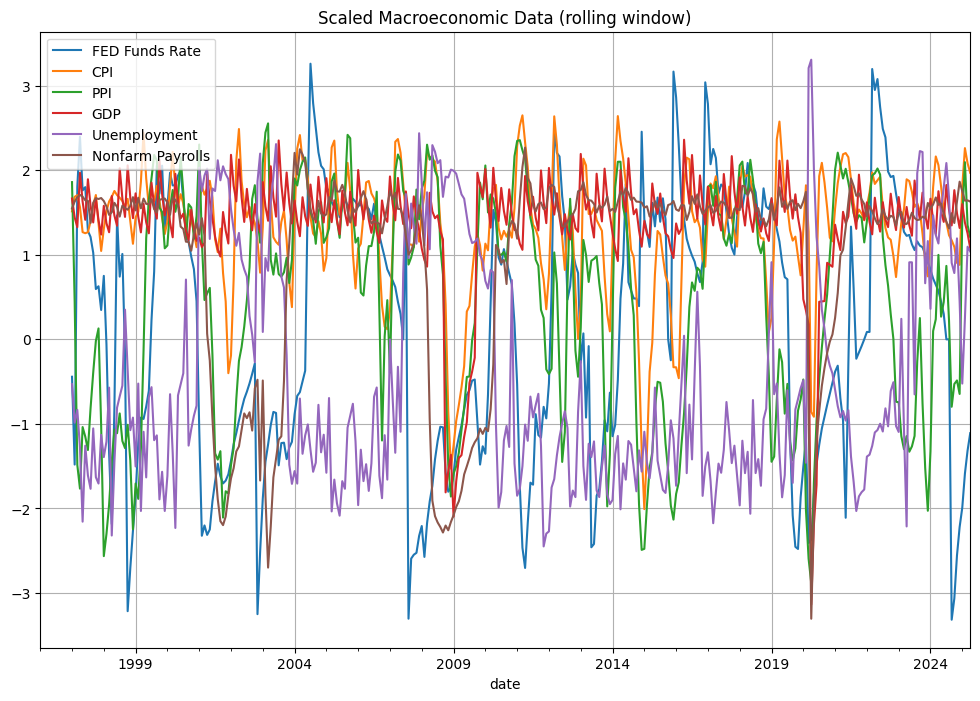

In [32]:
scaler = StandardScaler()
# scaler = MinMaxScaler()
# scaler = RobustScaler()
# scaler = MaxAbsScaler()

data = macrodata_cp.values
# data = macrodata_returns.values
# scaled_data = scaler.fit_transform(data)
scaled_data = rolling_window_scaling(data, window_size=12, scaler=scaler)
scaled_data_df = pd.DataFrame(scaled_data, columns=macrodata_cp.columns, index=macrodata_cp.index)

scaled_data_df.plot(figsize=(12, 8), subplots=False, title='Scaled Macroeconomic Data (rolling window)', grid=True)

---
---
---

# Macroeconomic indices
Since PCA is linear and aims to capture global variance, it excels at decomposing long-run economic regimes. It is highly interpretable and highly relevant when constructing macroeconomic indices.

In [33]:
scaled_data_df = scaled_data_df.dropna()
scaled_data = scaled_data_df.values

In [34]:
pca = PCA()
pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)
pca_cols = [f'PC{i+1}' for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_data, columns=pca_cols)
pca_df.index = scaled_data_df.index

In [35]:
threshold = 0.9
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)
n_components_thresh = np.argmax(cumulative_variance >= threshold) + 1
print(f"Number of components explaining {round(threshold*100)}% of the variance: {n_components_thresh} (out of {scaled_data_df.shape[1]} variables)")

Number of components explaining 90% of the variance: 4 (out of 6 variables)


In [36]:
pca_loadings = pd.DataFrame(pca.components_, index=pca_cols, columns=macrodata_cp.columns).mul(100)
pca_loadings["Explained Variance"] = pca.explained_variance_ratio_ * 100
styled_df = (
    pca_loadings
    .style
    .format("{:.2f}%")
    .background_gradient(cmap='coolwarm', vmin=-100, vmax=100, axis=None, subset=pca_loadings.columns[:-1])  # Exclude last col
    .background_gradient(cmap='Greys', vmin=0, vmax=100, subset=['Explained Variance'])  # Custom for Explained Variance
    .set_properties(**{
        'font-size': '15px',
        'padding': '12px',
        'text-align': 'center'
    })
    .set_table_styles([
        {'selector': 'th', 'props': [('font-size', '18px'), ('padding', '12px')]},
        {'selector': 'td.col_heading.level0', 'props': [('border-right', 'px solid black')]},  # Optional right border
        {'selector': 'td.col_heading.level1', 'props': [('border-right', '2px solid black')]}
    ])
)
styled_df

,FED Funds Rate,CPI,PPI,GDP,Unemployment,Nonfarm Payrolls,Explained Variance
PC1,61.13%,11.34%,20.70%,17.46%,-55.76%,47.88%,48.53%
PC2,-30.98%,34.96%,87.08%,13.16%,7.52%,-2.42%,23.05%
PC3,71.98%,-5.59%,24.78%,-12.80%,43.18%,-46.32%,15.38%
PC4,9.68%,33.46%,-20.57%,41.90%,64.91%,48.93%,6.35%
PC5,2.60%,43.18%,-24.75%,60.23%,-26.98%,-56.22%,4.00%
PC6,4.75%,75.06%,-18.43%,-63.05%,-5.27%,0.97%,2.69%


We performed a naive PCA on the standardized macroeconomic indicators without pre-selecting the number of components. We PCA using the following macroeconomic variables:
- **FED Funds Rate** (Policy)
- **CPI**, **PPI** (Inflation)
- **GDP** (Growth/Output)
- **Unemployment**, **Nonfarm Payrolls** (Labor)

<!-- ---

### ✅ PC1 — Monetary Tightening & Labor Market Strength
- **High positive loadings**:
  - FED Funds Rate, Nonfarm Payrolls
- **Strong negative loading**:
  - Unemployment
- **Moderate positive**:
  - GDP, PPI
- **Interpretation**: A clear **expansion-tightening** dimension. Reflects **strong macro + policy response**. Suitable as a **composite macroeconomic strength index**.

📌 **In summary**: This component captures the **macro cycle**, combining policy tightening (rate hikes), growth (employment, GDP), and low unemployment. Higher PC1 indicates **expansionary phases with policy tightening**.


### ✅ PC2 — Inflationary Pressures
- **Very high positive**: PPI, CPI
- **Moderate negative**: FED Funds Rate
- **Low loadings elsewhere**
- **Interpretation**: Reflects **raw inflation** signal decoupled from central bank action. Useful to **capture price pressure regimes**.

📌 **In summary**: Captures **price pressures from producers** not necessarily matched by central bank response. May indicate **inflationary tensions or lag in policy response**. Possibly linked to **commodity shocks**.


### 🔎 PC3 — Policy/Labor Conflict
- **Strong positive**: FED Funds Rate, Unemployment
- **Strong negative**: Nonfarm Payrolls
- **Mild positive**: GDP
- **Interpretation**: Captures **policy pressure amid labor weakness**. May highlight **policy mistake risk or stagflation setup**.

📌 **In summary**: Indicates a **policy-tightening regime associated with labor market weakening**. Possibly reflects periods of **restrictive policy responses to overheating**, or early-cycle slowdowns.


### ❌ PC4 — Diffuse
- **Positive**: CPI, GDP, Unemployment, Payrolls
- **Negative**: PPI
- **Interpretation**: More diffuse. Potentially **reflation narrative** (rising output & prices) with **mixed labor implications**.
- **Weak macro signal**, but could be monitored.

📌 **In summary**: Captures broad-based **real economic strength**, with synchronized improvements in employment, output, and prices. Could reflect **recovery phases** or **sustained expansions**.


### 🔎 PC5 — Growth-Payroll Divergence
- **Positive**: GDP, CPI
- **Strong negative**: Payrolls, PPI
- **Interpretation**: Captures periods where **growth and employment diverge**, possibly post-shock recoveries or measurement frictions.

📌 **In summary**: Suggests **decoupling between GDP and labor market**. Possibly reflects **productivity gains**, **automation**, or **jobless recoveries**.


### ❌ PC6 — CPI-Only Shock
- **Single strong positive**: CPI
- All other variables low or negative
- **Interpretation**: Looks like **noise or isolated CPI movement**. Not structurally useful.

📌 **In Summary**: Captures episodes of **high consumer inflation amid economic slowdown**. Potentially reflects **stagflation-like scenarios** or **supply-driven inflation** with weak growth.


--- -->

### Index Construction
- **PC1**: Core macro–policy strength signal (main index)
- **PC2**: Orthogonal inflation dimension
- **PC3**: Labor–policy divergence (optional)
- **PC5**: Growth-Payroll Divergence (optional)


<!-- | PC  | Dominant Theme                    | Key Variables                          |
|-----|----------------------------------|----------------------------------------|
| PC1 | Macro Expansion / Tightening     | FED Rate ↑, NFP ↑, Unemp ↓             |
| PC2 | Cost Inflation Pressure          | PPI ↑, CPI ↑, FED Rate ↓               |
| PC3 | Policy vs Labor Conflict         | FED Rate ↑, Unemp ↑, NFP ↓             |
| PC4 | Real Growth Recovery             | GDP ↑, NFP ↑, Unemp ↑                  |
| PC5 | GDP–Employment Decoupling        | GDP ↑, CPI ↑, NFP ↓, Unemp ↓           |
| PC6 | Stagflation / CPI vs Growth      | CPI ↑, GDP ↓, Unemp ↓                  | -->

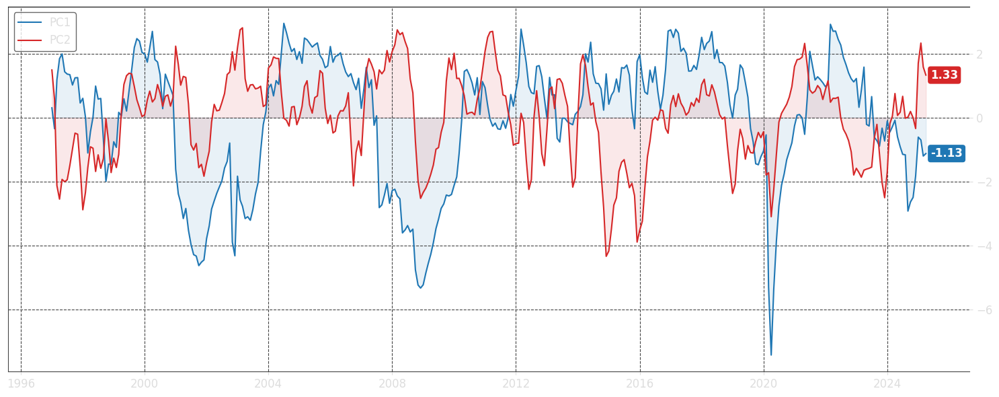

In [37]:
fig, ax = bloomberg_plot(
    Xs=[pca_df.index],
    Ys=[pca_df["PC1"], pca_df["PC2"]],
    list_of_labels=["PC1", "PC2"],
    # title="Principal Components Over Time",
    x_label="",
    y_label="",
    fig_size=(15, 6), show_last_val=True
)

fig.show()

### Change Point Detection: Macro Strength focused

In [38]:
macro_index = pca_df['PC1']
inflation_index = pca_df['PC2']

model = "rbf"

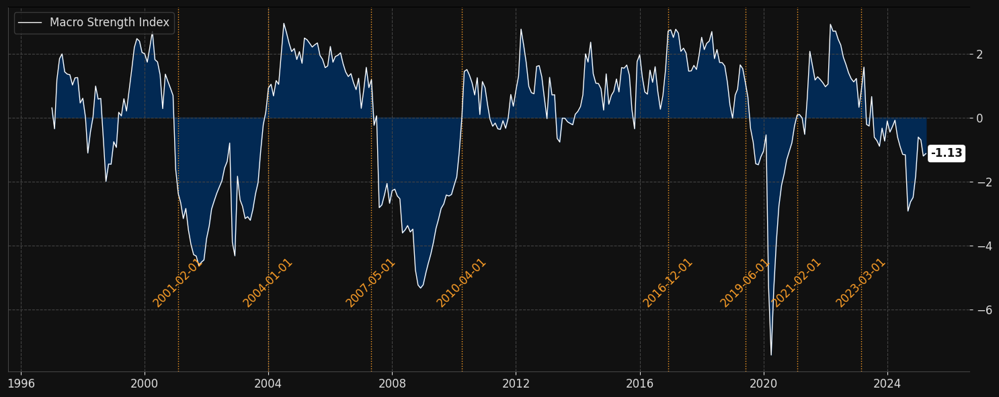

In [170]:
algo = rpt.Pelt(model=model).fit(macro_index.values)
breaks = algo.predict(pen=5)[:-1] # Penalty controls number of breaks; tune as needed
break_dates = [macro_index.index[i-1] for i in breaks]

fig, ax = bloomberg_plot(
    Xs=[macro_index.index],
    Ys=[macro_index],
    list_of_labels=["Macro Strength Index"],
    x_label="",
    y_label="",
    h_lines=None,
    v_lines=break_dates,
    fig_size=(15, 6), show_last_val=True
)
for i in range(len(break_dates)):
    ax.text(break_dates[i], -6, break_dates[i].strftime('%Y-%m-%d'), rotation=45, ha='center', va='bottom', fontsize=12, color=BLOOM_YELLOW)

plt.savefig("images/macro_strength_index_break_points.pdf", format="pdf")
fig.show()

---
---
---

# Text Pre-processing

### Getting data: central bankers speeches

In [40]:
"""
load_CB_speeches (year: 'str | int | list' = 'all', cache: 'bool' = True, timeout: 'float | None' = 120, **kwargs) -> 'pd.DataFrame'

Args:
    year: Either 'all' to download all available central bank speeches or the year(s)
        to download. Defaults to 'all'.
    cache: If False, cached data will be ignored and the dataset will be downloaded again.
        Defaults to True.
    timeout: The timeout to for downloading each speeches file. Set to `None` to disable
        timeout. Defaults to 120.
    **kwargs. Additional keyword arguments which will be passed to pandas `read_csv` function.

Returns:
    A pandas DataFrame containing the speeches dataset.
"""

def load_speeches(start: str, end: str = None, cache: bool = False) -> pd.DataFrame:
    start_date = pd.to_datetime(start)
    end_date = pd.to_datetime('today') if end is None else pd.to_datetime(end)
    if start_date > end_date:
        raise ValueError("Start date must be before end date.")

    # start_year = start_date.year
    # end_year = end_date.year
    # years = list(range(start_year, end_year + 1))
    speeches = load_CB_speeches(year='all', cache=cache)
    speeches['date'] = pd.to_datetime(speeches['date'])
    speeches = speeches[(speeches['date'] >= start_date) & (speeches['date'] < end_date)]
    speeches = speeches.sort_values(by='date')
    speeches = speeches.reset_index(drop=True)
    return speeches

In [41]:
fpath = f'data/gingado_central-bank-speeches_{START_DATE}_{END_DATE}.csv'
if not os.path.exists(fpath):
    print(f"File not found: {fpath}")
    print("Downloading the dataset...")
    speeches = load_speeches(START_DATE, END_DATE)
    speeches['date'] = pd.to_datetime(speeches['date'])
    speeches.to_csv(fpath, index=False)
    print(f"Found {len(speeches)} speeches, saved and loaded.")
else:
    print(f"File found: {fpath}")
    print("Loading the dataset...")
    speeches = pd.read_csv(fpath, parse_dates=['date'])
    print(f"Found {len(speeches)} speeches, loaded.")

File found: data/gingado_central-bank-speeches_1996-01-01_2025-05-01.csv
Loading the dataset...
Found 19776 speeches, loaded.


In [42]:
speeches

,url,title,description,date,text,author
0,https://www.bis.org/review/r970211c.pdf,Mr. Chen discusses monetary relations between ...,Speech by the Deputy Governor of the People's ...,1996-09-10,Mr. Chen discusses monetary relations between ...,Chen Yuan
1,https://www.bis.org/review/r970211a.pdf,Mr. Dai assesses the outlook for Hong Kong as ...,Speech by the Governor of the People's Bank of...,1996-09-30,Mr. Dai assesses the outlook for Hong Kong as ...,Dai Xianglong
2,https://www.bis.org/review/r970107a.pdf,Mr. Matsushita considers the role of monetary ...,Translated excerpts of a speech given by the G...,1996-11-06,Mr. Matsushita considers the role of monetary ...,Yasuo Matsushita
3,https://www.bis.org/review/r970211b.pdf,Mr. Dai looks at the possibilities of strength...,Speech by the Governor of the People's Bank of...,1996-11-13,Mr. Dai looks at the possibilities of strength...,Dai Xianglong
4,https://www.bis.org/review/r970108c.pdf,Mr. Davies gives his personal view of EMU (Ce...,Speech by the Deputy Governor of the Bank of E...,1996-12-16,Speech by the Deputy Governor\nMr. Davies give...,Mervyn King
...,...,...,...,...,...,...
19771,https://www.bis.org/review/r250401a.htm,Ida Wolden Bache: Policy rate kept unchanged,"Introductory statement by Ms Ida Wolden Bache,...",2025-03-27,Ida Wolden Bache: Policy rate kept unchanged\n...,Ida Wolden Bache
19772,https://www.bis.org/review/r250401c.htm,Isabel Schnabel: Financial literacy and moneta...,"Speech by Ms Isabel Schnabel, Member of the Ex...",2025-03-27,SPEECH\nFinancial literacy and monetary policy...,Isabel Schnabel
19773,https://www.bis.org/review/r250401b.htm,Claudia Buch: Hearing of the Committee on Econ...,"Introductory statement by Prof Claudia Buch, C...",2025-03-27,SPEECH\nHearing of the Committee on Economic a...,Claudia Buch
19774,https://www.bis.org/review/r250401e.htm,Fabio Panetta: Overview of economic and financ...,"Address by Mr Fabio Panetta, Governor of the B...",2025-03-31,Fabio Panetta: Overview of economic and financ...,Fabio Panetta


### Pre-processing data

1. Filtering US Central Banker's speeches: using OpenAI's ChatGPT for NER

In [43]:
res_example_1 = '{ "organization": "Bank of England", "region": "UK" }'
res_example_2 = '{ "organization": "European Central Bank", "region": "EU" }'
res_example_3 = '{ "organization": "Bank of Japan", "region": "JP" }'

PROMPT_BASE = f'''Extract the organization and original region (country code when available or at least continent code-e.g. EU for Europe) of ###AUTHOR### who is the author of the speech title and description given bellow.
Return the result as a Python dictionary with the keys "organization" and "region" and the extracted corresponding values.
Result example 1: {res_example_1}
Result example 2: {res_example_2}
Result example 3: {res_example_3}
Don't add anything else, strictly adheres to example format and give the the region as two digits code, replace values by None (no brackets) if you are not able to find it.
The speech has been given on ###DATE###.
Title: "###TITLE###".
Description is: "###DESCRIPTION###".
'''

def get_prompt(title: str, description: str, author: str, date: str) -> str:
    if author is None: author = ""
    if description is None: description = ""
    if title is None: title = ""
    if date is None: date = ""

    if not isinstance(title, str): title = str(title)
    if not isinstance(description, str): description = str(description)
    if not isinstance(author, str): author = str(author)
    if not isinstance(date, str): date = str(date)

    prompt = PROMPT_BASE
    prompt = prompt.replace('###TITLE###', title)
    prompt = prompt.replace('###DESCRIPTION###', description)
    prompt = prompt.replace('###AUTHOR###', author)
    prompt = prompt.replace('###DATE###', date)
    return prompt

def get_treated_speeches(speeches: pd.DataFrame) -> pd.DataFrame:
    if not "region" in speeches.columns:
        speeches["region"] = None
    if not "organization" in speeches.columns:
        speeches["organization"] = None

    for idx, row in tqdm(speeches.iterrows(), total=len(speeches)):
        if (row['region'] is not None) and (row['organization'] is not None):
            continue
        title = row['title']
        description = row['description']
        author = row['author']
        date = row['date'].strftime('%Y-%m-%d')
        prompt = get_prompt(title, description, author, date)
        response = openai_chat(prompt, verbose=False)
        # response = gemini_chat(prompt, verbose=False)
        try:
            result = json.loads(response)
            if not isinstance(result, dict):
                if isinstance(result, str):
                    try:
                        result = eval(result)
                    except:
                        print(f"Error evaluating string for author: {author}, date: {date}")
                        continue
        except json.JSONDecodeError:
            print(f"Error decoding JSON for author: {author}, date: {date}")
            continue
        if 'organization' in result:
            speeches.at[idx, 'organization'] = result['organization']
        if 'region' in result:
            speeches.at[idx, 'region'] = result['region']

    return speeches

In [44]:
fpath = f'data/gingado_us-central-bank-speeches_{START_DATE}_{END_DATE}.csv'

if not os.path.exists(fpath):
    print(f"US speeches file not found: {fpath}")

    main_fpath = f'data/gingado_central-bank-speeches_{START_DATE}_{END_DATE}-ner.csv'
    if not os.path.exists(main_fpath):
        print(f"Main NER speeches file does not exist: {main_fpath}. Saving the dataset...")
        # all_speeches = get_only_us_speeches(speeches)
        treated_speeches = get_treated_speeches(speeches)
        treated_speeches.to_csv(main_fpath, index=False)
    else:
        print(f"Main NER speeches file found: {main_fpath}. Loading the dataset...")
        treated_speeches = pd.read_csv(main_fpath, parse_dates=['date'], keep_default_na=False)
        print(f"Found {len(treated_speeches)} total treated speeches, loaded.")

    us_speeches = treated_speeches[treated_speeches['region'] == 'US'].copy().reset_index(drop=True)
    us_speeches.to_csv(fpath, index=False)

else:
    print(f"US speeches file found: {fpath}. Loading the dataset...")
    us_speeches = pd.read_csv(fpath, parse_dates=['date'], keep_default_na=False)

print(f"Resulting in {len(us_speeches)} US speeches, loaded.")
print(int(us_speeches.groupby(us_speeches.date.dt.year).size().mean()), " average number of speeches per year")
print(us_speeches.date.min(), us_speeches.date.max())

US speeches file found: data/gingado_us-central-bank-speeches_1996-01-01_2025-05-01.csv. Loading the dataset...
Resulting in 2342 US speeches, loaded.
78  average number of speeches per year
1996-12-19 00:00:00 2025-03-25 00:00:00


In [100]:
# main_fpath = f'data/gingado_central-bank-speeches_{START_DATE}_{END_DATE}-ner.csv'
# treated_speeches = pd.read_csv(main_fpath, parse_dates=['date'], keep_default_na=False)
# treated_speeches

In [45]:
us_speeches

,url,title,description,date,text,author,region,organization,documents,embeddings
0,https://www.bis.org/review/r970108b.pdf,Ms. Rivlin discusses the prudential regulation...,Remarks by the Vice Chairman of the Board of G...,1996-12-19,Ms. Rivlin discusses the prudential regulation...,Alice M Rivlin,US,US Federal Reserve System,Ms. PERSON discusses the prudential regulation...,[ 0.05187089 0.01443352 0.05947338 ... -0.03...
1,https://www.bis.org/review/r970108a.pdf,Mr. Meyer examines the role for structural mac...,"Remarks by Mr. Laurence H. Meyer, a member of ...",1997-01-05,Mr. Meyer examines the role for structural mac...,Laurence H Meyer,US,US Federal Reserve System,Mr. PERSON examines the role for structural ma...,[-0.00612069 0.00932549 0.01052813 ... -0.02...
2,https://www.bis.org/review/r970116.pdf,Mr. Greenspan addresses some key roles of a ce...,Remarks by the Chairman of the Board of Govern...,1997-01-14,Remarks by the\nMr. Greenspan addresses some k...,Alan Greenspan,US,US Federal Reserve System,Remarks by the Mr. PERSON addresses some key r...,[ 0.00361372 0.00122012 0.07897815 ... -0.03...
3,https://www.bis.org/review/r970121a.pdf,Mr. Meyer reviews the economic outlook and cha...,"Remarks by Mr. Laurence H. Meyer, a member of ...",1997-01-16,Mr. Meyer reviews the economic outlook and cha...,Laurence H Meyer,US,US Federal Reserve System,Mr. PERSON reviews the economic outlook and ch...,[ 0.01417234 0.00069248 0.01662661 ... -0.03...
4,https://www.bis.org/review/r970122a.pdf,Mr. Greenspan gives some personal perspectives...,Testimony of the Chairman of the Board of Gove...,1997-01-21,Mr. Greenspan gives some personal perspectives...,Alan Greenspan,US,Federal Reserve System,Mr. PERSON gives some personal perspectives on...,[ 0.02805406 0.01024016 0.04986759 ... -0.03...
...,...,...,...,...,...,...,...,...,...,...
2337,https://www.bis.org/review/r250311a.htm,"Michelle W Bowman: Remarks on ""Monetary policy...","Remarks by Ms Michelle W Bowman, Member of the...",2025-03-07,"Michelle W Bowman: Remarks on ""Monetary policy...",Michelle W Bowman,US,Federal Reserve System,"PERSON: PERSON on ""Monetary policy transmissio...",[-0.01081238 0.00100582 0.01864113 ... -0.02...
2338,https://www.bis.org/review/r250324c.htm,John C Williams: Certain uncertainty,"Remarks by Mr John C Williams, President and C...",2025-03-21,"Certain Uncertainty\nMarch 21, 2025\nJohn C. W...",John C Williams,US,Federal Reserve Bank of New York,"Certain Uncertainty DATE PERSON, President and...",[ 0.01261934 -0.01676599 0.03921724 ... -0.03...
2339,https://www.bis.org/review/r250325c.htm,Michael S Barr: Helping small businesses reach...,"Speech by Mr Michael S Barr, Vice Chair for Su...",2025-03-24,For release on delivery\n3:10 p.m. EDT\nMarch ...,Michael S Barr,US,Federal Reserve System,For release on delivery TIME DATE Helping PERS...,[ 0.01554987 0.02104288 0.04312424 ... -0.04...
2340,https://www.bis.org/review/r250326b.htm,John C Williams: Opening remarks - New York Fe...,"Opening remarks by Mr John C Williams, Preside...",2025-03-25,John C Williams: Opening remarks - New York Fe...,John C Williams,US,Federal Reserve Bank of New York,PERSON: Opening remarks - ORGANIZATION Communi...,[ 0.02028746 -0.01633177 0.03845165 ... -0.02...


2. Data cleaning

In [46]:
stop_words = STOP_WORDS

try:
    entity_detection = spacy.load("en_core_web_sm")
except:
    print("Downloading the spaCy model...")
    spacy_helpers.install_spacy_model(lang='en', pipeline_for="sm")
    entity_detection = spacy.load("en_core_web_sm")

def clean_text(text: str) -> str:

    # 0. Remove newlines and special characters
    text = text.replace('\n', ' ')
    text = text.replace('\r', ' ')
    text = text.replace('\t', ' ')
    text = text.replace('\\', ' ')

    # 1. Normalize Unicode
    text = unicodedata.normalize("NFKC", text)
    
    # 2. Remove non-informative patterns
    text = re.sub(r'\s+', ' ', text)        # normalize whitespace
    text = re.sub(r'[•◦▪●]', '', text)      # remove bullet symbols
    text = re.sub(r'[_*~^]+', '', text)     # remove markdown / symbol clutter

    # 3. Mask entities (dates, times, locations, names and organizations)
    entities = entity_detection(text).ents
    for ent in entities:
        if ent.label_ == "DATE" and ent.text.lower() not in ['today', 'tomorrow', 'yesterday']:
            text = text.replace(ent.text, 'DATE')
        elif ent.label_ == "TIME":
            text = text.replace(ent.text, 'TIME')
        # elif ent.label_ == "GPE":
        #     text = text.replace(ent.text, 'LOCATION')
        elif ent.label_ == "PERSON":
            text = text.replace(ent.text, 'PERSON')
        elif ent.label_ == "ORG":
            text = text.replace(ent.text, 'ORGANIZATION')

    # 4. Mask percentages and numbers
    text = re.sub(r'\b\d+(\.\d+)?%?\b', 'NUM', text)

    # 5. Strip leading/trailing whitespace
    text = text.strip()

    return text


def get_clean_text(row, max_lenght=20000) -> str:
    title = row['title']
    description = row['description']
    text = row['text']
    text = text.replace(title, '').replace(description, '')
    text = clean_text(text)
    words = text.split()
    if len(words) > max_lenght:
        text = ' '.join(words[:max_lenght])
    return text

def get_clean_texts(df: pd.DataFrame, max_lenght=20000, verbose=False) -> list:
    documents = []
    if verbose:
        for i, row in tqdm(df.iterrows(), total=len(df)):
            document = get_clean_text(row, max_lenght=max_lenght)
            documents.append(document)
    else:
        return df.apply(get_clean_text, axis=1, max_lenght=max_lenght).values.tolist()
    
    return documents

STOP_WORDS += ["DATE", "TIME", "PERSON", "ORGANIZATION", "NUM"]

In [47]:
fpath = f'data/gingado_us-central-bank-speeches_{START_DATE}_{END_DATE}.csv'
us_speeches = pd.read_csv(fpath, parse_dates=['date'])
if "documents" not in us_speeches.columns:
    print("Column 'documents' not found. Cleaning the texts...")
    documents = get_clean_texts(us_speeches, max_lenght=10000, verbose=True)
    us_speeches['documents'] = documents
    us_speeches.to_csv(fpath, index=False)
else:
    print("Column 'documents' found. Loading the cleaned texts...")
    documents = us_speeches['documents'].tolist()

Column 'documents' found. Loading the cleaned texts...


In [48]:
# MODEL_NAME = 'intfloat/multilingual-e5-large-instruct' # HuggingFace
# MODEL_NAME = 'FinLang/finance-embeddings-investopedia' # HuggingFace FinBERT
# MODEL_NAME = 'ProsusAI/finbert' # HuggingFace FinBERT
MODEL_NAME = "text-embedding-3-small" # OpenAI
# MODEL_NAME = "text-embedding-004" # Google Gemini

EMBEDDING_MODEL = OpenAIEmbedding(model=MODEL_NAME)
# EMBEDDING_MODEL = GoogleAIEmbedding(model=MODEL_NAME)
# EMBEDDING_MODEL = AdvancedGoogleAIEmbedding(model='text-embedding-004', task='clustering')
# EMBEDDING_MODEL = SentenceTransformer(MODEL_NAME, device=DEVICE)

fpath = f'data/gingado_us-central-bank-speeches_{START_DATE}_{END_DATE}.pickle'
if not os.path.exists(fpath):
    print(f"File not found ({fpath}), computing the embeddings...")
    embeddings = EMBEDDING_MODEL.encode(documents, fast=False)
    us_speeches['embeddings'] = list(embeddings)
    us_speeches.to_pickle(fpath)
else:
    print(f"File found ({fpath}), loading the embeddings...")
    us_speeches = pd.read_pickle(fpath)

File found (data/gingado_us-central-bank-speeches_1996-01-01_2025-05-01.pickle), loading the embeddings...


In [49]:
us_speeches

,url,title,description,date,text,author,region,organization,documents,embeddings,sentiment
0,https://www.bis.org/review/r970108b.pdf,Ms. Rivlin discusses the prudential regulation...,Remarks by the Vice Chairman of the Board of G...,1996-12-19,Ms. Rivlin discusses the prudential regulation...,Alice M Rivlin,US,US Federal Reserve System,Ms. PERSON discusses the prudential regulation...,"[0.051870886236429214, 0.014433516189455986, 0...","{'positive': 0.06645319946110248, 'negative': ..."
1,https://www.bis.org/review/r970108a.pdf,Mr. Meyer examines the role for structural mac...,"Remarks by Mr. Laurence H. Meyer, a member of ...",1997-01-05,Mr. Meyer examines the role for structural mac...,Laurence H Meyer,US,US Federal Reserve System,Mr. PERSON examines the role for structural ma...,"[-0.006120691541582346, 0.009325488470494747, ...","{'positive': 0.0591125104110688, 'negative': 0..."
2,https://www.bis.org/review/r970116.pdf,Mr. Greenspan addresses some key roles of a ce...,Remarks by the Chairman of the Board of Govern...,1997-01-14,Remarks by the\nMr. Greenspan addresses some k...,Alan Greenspan,US,US Federal Reserve System,Remarks by the Mr. PERSON addresses some key r...,"[0.003613721812143922, 0.0012201220961287618, ...","{'positive': 0.1106236893683672, 'negative': 0..."
3,https://www.bis.org/review/r970121a.pdf,Mr. Meyer reviews the economic outlook and cha...,"Remarks by Mr. Laurence H. Meyer, a member of ...",1997-01-16,Mr. Meyer reviews the economic outlook and cha...,Laurence H Meyer,US,US Federal Reserve System,Mr. PERSON reviews the economic outlook and ch...,"[0.014076086692512035, 0.0006873089005239308, ...","{'positive': 0.14275333788245917, 'negative': ..."
4,https://www.bis.org/review/r970122a.pdf,Mr. Greenspan gives some personal perspectives...,Testimony of the Chairman of the Board of Gove...,1997-01-21,Mr. Greenspan gives some personal perspectives...,Alan Greenspan,US,Federal Reserve System,Mr. PERSON gives some personal perspectives on...,"[0.028054064139723778, 0.010240158997476101, 0...","{'positive': 0.3027808503913028, 'negative': 0..."
...,...,...,...,...,...,...,...,...,...,...,...
2337,https://www.bis.org/review/r250311a.htm,"Michelle W Bowman: Remarks on ""Monetary policy...","Remarks by Ms Michelle W Bowman, Member of the...",2025-03-07,"Michelle W Bowman: Remarks on ""Monetary policy...",Michelle W Bowman,US,Federal Reserve System,"PERSON: PERSON on ""Monetary policy transmissio...","[-0.010812383145093918, 0.00100582221057266, 0...","{'positive': 0.20888198829359478, 'negative': ..."
2338,https://www.bis.org/review/r250324c.htm,John C Williams: Certain uncertainty,"Remarks by Mr John C Williams, President and C...",2025-03-21,"Certain Uncertainty\nMarch 21, 2025\nJohn C. W...",John C Williams,US,Federal Reserve Bank of New York,"Certain Uncertainty DATE PERSON, President and...","[0.012619341723620892, -0.01676599122583866, 0...","{'positive': 0.13514629006385803, 'negative': ..."
2339,https://www.bis.org/review/r250325c.htm,Michael S Barr: Helping small businesses reach...,"Speech by Mr Michael S Barr, Vice Chair for Su...",2025-03-24,For release on delivery\n3:10 p.m. EDT\nMarch ...,Michael S Barr,US,Federal Reserve System,For release on delivery TIME DATE Helping PERS...,"[0.01554986834526062, 0.021042879670858383, 0....","{'positive': 0.11291907106836636, 'negative': ..."
2340,https://www.bis.org/review/r250326b.htm,John C Williams: Opening remarks - New York Fe...,"Opening remarks by Mr John C Williams, Preside...",2025-03-25,John C Williams: Opening remarks - New York Fe...,John C Williams,US,Federal Reserve Bank of New York,PERSON: Opening remarks - ORGANIZATION Communi...,"[0.02028745971620083, -0.01633176952600479, 0....","{'positive': 0.10524065420031548, 'negative': ..."


### Sentiment analysis

In [50]:
def get_sentiment_id(sentiments):
    probabilities = [sentiments["negative"], sentiments["neutral"], sentiments["positive"]]
    max_prob = max(probabilities)
    return probabilities.index(max_prob) - 1

def transform_output(output):
    return { s['label']: s['score'] for s in output }

def split_into_token_chunks(text, tokenizer, max_length=512, length_delta=10, stride=0):
    """
    Splits a text into chunks of at most `max_length` tokens using a for loop (no truncation).
    
    Args:
        text (str): Input text.
        tokenizer: HuggingFace tokenizer.
        max_length (int): Max number of tokens per chunk.
        length_delta (int): Security margin for the chunk length (optional).
        stride (int): Overlap between chunks (optional).
    
    Returns:
        List[str]: List of text chunks.
    """
    max_length -= length_delta
    encoding = tokenizer(text, return_offsets_mapping=True, add_special_tokens=False)
    input_ids = encoding["input_ids"]
    offsets = encoding["offset_mapping"]

    if len(input_ids) <= max_length:
        return [text]

    chunks = []
    step = max_length - stride if stride else max_length
    for start in range(0, len(input_ids), step):
        end = min(start + max_length, len(input_ids))
        start_offset = offsets[start][0]
        end_offset = offsets[end - 1][1]
        chunk_text = text[start_offset:end_offset]
        chunks.append(chunk_text)

    return chunks

def get_sentiment(text, tokenizer, sentiment_model, batch_size=16, max_length=512, length_delta=10, stride=0):
    chunks = split_into_token_chunks(text, tokenizer, max_length, length_delta, stride)
    if len(chunks) == 1:
        return transform_output(sentiment_model(chunks[0])[0])

    # Get average positive, negative, neutral probabilities
    sentiments = sentiment_model(chunks, verbose=True, max_length=max_length, truncation=False, batch_size=batch_size)
    sentiments = [transform_output(s) for s in sentiments]
    return {
        "positive": np.mean([s["positive"] for s in sentiments]),
        "negative": np.mean([s["negative"] for s in sentiments]),
        "neutral": np.mean([s["neutral"] for s in sentiments])
    }

In [51]:
fpath = f'data/gingado_us-central-bank-speeches_{START_DATE}_{END_DATE}.pickle'
us_speeches: pd.DataFrame = pd.read_pickle(fpath)

if "sentiment" not in us_speeches.columns:
    print("Column 'sentiment' not found. Getting sentiment...")
    sentiment_model_name = "ProsusAI/finbert"
    sentiment_model = pipeline('sentiment-analysis', model=sentiment_model_name, top_k=None, device=DEVICE)
    max_length = sentiment_model.tokenizer.model_max_length

    sentiments = []
    for idx, row in tqdm(us_speeches.iterrows(), total=len(us_speeches)):
        doc = row['documents']
        temp_sentiment = get_sentiment(doc, sentiment_model.tokenizer, sentiment_model, batch_size=16, max_length=max_length)
        sentiments.append(temp_sentiment)
    us_speeches['sentiment'] = sentiments
    us_speeches.to_pickle(fpath)
else:
    print("Column 'sentiment' found. Nothing to do.")

Column 'sentiment' found. Nothing to do.


### Polarity score

In [52]:
# https://www.alpha-sense.com/blog/engineering/sentiment-score/
# https://help.sesamm.com/article/32-sentiment-polarity
# https://help.sesamm.com/article/32-sentiment-polarity

def sentiment_to_polarity(sentiment):
    p_pos = sentiment["positive"]
    p_neg = sentiment["negative"]
    p_neu = sentiment["neutral"]
    return (p_pos - p_neg) / (p_pos + p_neg + p_neu)

In [53]:
if "polarity" not in us_speeches.columns:
    us_speeches["polarity"] = us_speeches["sentiment"].apply(sentiment_to_polarity)

---
---
---

# Polarity drift analysis, Subprime crisis use case

In [ ]:
# i = 0 # Dot-com bubble
# i = 1 # Post dot-com bubble recovery
i = 2 # Subprime crisis 
# i = 3 # Post subprime crisis recovery
# i = 4 # Brexit?
# i = 5 # COVID-19
# i = 6 # Post COVID-19 recovery
# i = 7 # Inflation

if i == 0:
    start_date = us_speeches['date'].min()
    break_point_date = break_dates[i]
    end_date = break_dates[i+1]
elif i == len(break_dates) - 1:
    start_date = break_dates[i-1]
    break_point_date = break_dates[i]
    end_date = us_speeches['date'].max()
else:
    start_date = break_dates[i-1]
    break_point_date = break_dates[i]
    end_date = break_dates[i+1]

temp_df = us_speeches[(us_speeches['date'] >= start_date) & (us_speeches['date'] < end_date)]
temp_df = temp_df.reset_index(drop=True)
print(f"Start date: {start_date}, Break point date: {break_point_date}, End date: {end_date}")
print(f"Found {len(temp_df)} speeches in the period.")

Start date: 2004-01-01 00:00:00, Break point date: 2007-05-01 00:00:00, End date: 2010-04-01 00:00:00
Found 600 speeches in the period.


---
---
---

# Polarity drift analysis, Subprime crisis use case: UMAP + Leiden clustering

Explain novelty and improvements here

##### 1.1. Getting data

In [60]:
period_A = temp_df[temp_df['date'] <= break_point_date].copy()
documents_A = period_A["documents"].values.tolist()
embeddings_A = np.stack(period_A['embeddings'].values)

period_B = temp_df[temp_df['date'] > break_point_date].copy()
documents_B = period_B["documents"].values.tolist()
embeddings_B = np.stack(period_B['embeddings'].values)

In [61]:
embeddings_A.shape, embeddings_B.shape

((333, 1536), (267, 1536))

In [ ]:
period_A_polarity = period_A["polarity"].values
mean_A = np.mean(period_A_polarity)
period_B_polarity = period_B["polarity"].values
mean_B = np.mean(period_B_polarity)

plt.figure(figsize=(10, 5))
plt.hist(period_A_polarity, bins=50, alpha=0.5, label='Positive Reviews', color='blue')
plt.axvline(x=mean_A, color='blue', linestyle='--', label='Mean Pos. Review Sentiment')
plt.hist(period_B_polarity, bins=50, alpha=0.5, label='Negative Reviews', color='red')
plt.axvline(x=mean_B, color='red', linestyle='--', label='Mean Neg. Review Sentiment')
plt.axvline(x=0, color='black', linestyle='--')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("images/sentiment_score_frequency_amazon_reviews.pdf", format="pdf", bbox_inches='tight')
plt.show()

##### 1.2. Reduce dimension in A period anchored dimensional space

In [62]:
"""
UMAP parameters

- n_neighbors: Controls how UMAP balances local versus global structure in the data. Low values of n_neighbors will force UMAP to 
               concentrate on very local structure, while large values will push UMAP to look at larger neighborhoods of each point 
               when estimating the manifold structure of the data.

- min_dist: Controls how tightly UMAP is allowed to pack points together. It provides the minimum distance apart that points are 
            allowed to be in the low dimensional representation. This means that low values of min_dist will result in clumpier 
            embeddings. This can be useful if you are interested in clustering, or in finer topological structure. Larger values 
            of min_dist will prevent UMAP from packing points together and will focus on the preservation of the broad topological 
            structure instead.
"""
DIM_SIZE = 100
N_NEIGHBORS = 200
MIN_DIST = 0.0

# Dimensionality reduction used for clustering
dim_reducer = UMAP(n_components=DIM_SIZE, n_neighbors=N_NEIGHBORS, min_dist=MIN_DIST, 
                   metric='cosine', transform_mode="embedding", random_state=RANDOM_STATE)

# Dimensionality reduction used only for visualization purposes
vizualier = UMAP(n_components=2, n_neighbors=N_NEIGHBORS, min_dist=MIN_DIST, 
                   metric='cosine', transform_mode="embedding", random_state=RANDOM_STATE)

In [63]:
# mapper = dim_reducer.fit(embeddings_A)
# reduced_embeddings_A = dim_reducer.transform(embeddings_A)
reduced_embeddings_A = dim_reducer.fit_transform(embeddings_A)
print(reduced_embeddings_A.shape)

graph_A = dim_reducer.graph_
print(graph_A.shape)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


(333, 100)
(333, 333)


In [64]:
# # Plot the graph
# dim_to_show = 20
# plt.figure(figsize=(10, 10))
# plt.scatter(reduced_embeddings_A[:, dim_to_show], reduced_embeddings_A[:, dim_to_show+1], s=5)
# plt.title("UMAP Graph of Reduced Embeddings A")
# plt.show()

In [65]:
reduced_embeddings_B = dim_reducer.transform(embeddings_B)
print(reduced_embeddings_B.shape)

graph_B = umap.umap_.fuzzy_simplicial_set(
    X=embeddings_B,
    n_neighbors=dim_reducer.n_neighbors,
    random_state=dim_reducer.random_state,
    metric=dim_reducer.metric,
    metric_kwds=dim_reducer._metric_kwds,
    knn_indices=None,
    knn_dists=None,
    angular=dim_reducer.angular_rp_forest,
    set_op_mix_ratio=dim_reducer.set_op_mix_ratio,
    local_connectivity=dim_reducer.local_connectivity,
    verbose=False
)[0]
print(graph_B.shape)

(267, 100)
(267, 267)


In [66]:
# graph = block_diag([graph_A, graph_B])
# print(graph.shape)

# n_A = graph_A.shape[0]
# n_B = graph_B.shape[0]
# top = hstack([graph_A, csr_matrix((n_A, n_B))])
# # bottom = hstack([graph_B.T, csr_matrix((n_B, n_A))])
# bottom = hstack([graph_B, csr_matrix((n_B, n_A))])
# graph = vstack([top, bottom])
# print(graph.shape)

sim_matrix = cosine(embeddings_B, embeddings_A)
# sim_matrix[sim_matrix < 0.75] = 0  

n_B, n_A = sim_matrix.shape
k = 10
cross_edges = lil_matrix((n_B, n_A))
for i in range(n_B):
    top_k_indices = np.argpartition(sim_matrix[i], -k)[-k:]
    cross_edges[i, top_k_indices] = sim_matrix[i, top_k_indices]
cross_edges = csr_matrix(cross_edges)

top = hstack([graph_A, cross_edges.T])
bottom = hstack([cross_edges, graph_B])
graph = vstack([top, bottom])

In [67]:
embeddings_A_2D = vizualier.fit_transform(embeddings_A)
period_A["2D_embeddings"] = list(embeddings_A_2D)
embeddings_B_2D = vizualier.transform(embeddings_B)
period_B["2D_embeddings"] = list(embeddings_B_2D)

##### 1.3 Clustering with Leiden

In [68]:
dense_graph = graph.todense()
nx_graph = nx.from_numpy_array(np.array(dense_graph))

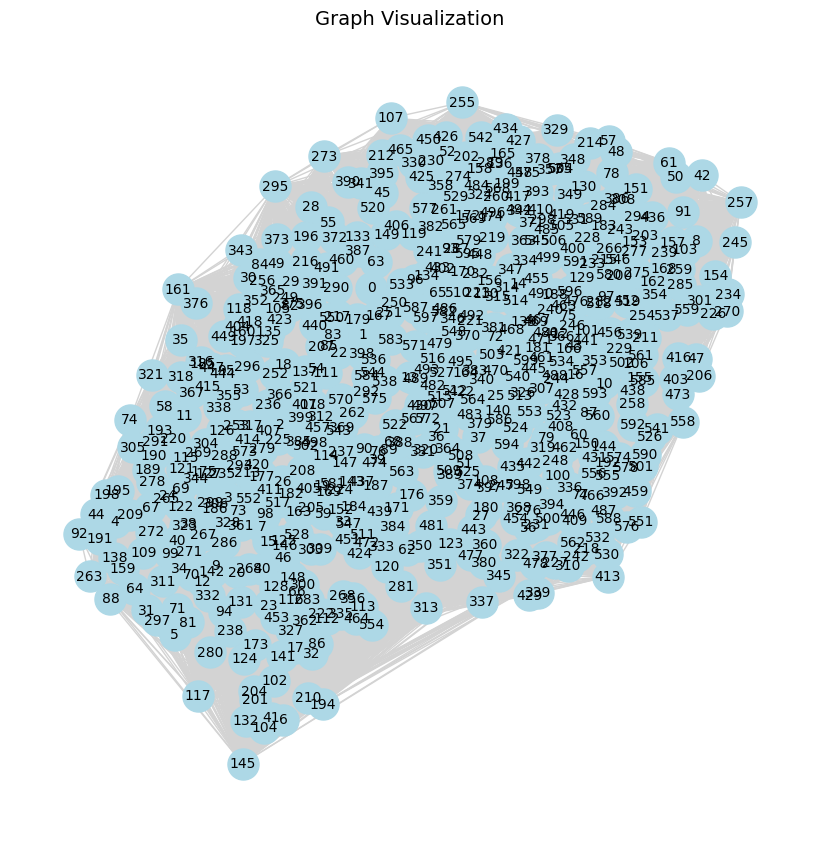

In [69]:
plt.figure(figsize=(8, 8))
pos = nx.spring_layout(nx_graph, seed=RANDOM_STATE)
nx.draw(
    nx_graph, pos, with_labels=True, node_color='lightblue',
    node_size=500, font_size=10, font_color='black', edge_color='lightgray'
)
plt.title("Graph Visualization", fontsize=14)
plt.show()

In [70]:
"""
Leiden parameters

- resolution: Controls the size (granularity) of the clusters. Higher values will result in more (small) clusters (= fine granularity), 
              while lower values will result in less (large) clusters (= coarser granularity). Recommended from 0.1 to 2.0

- modularity: Type of modularity to maximize. The default is "dugue".

- ...
"""

RESOLUTION = 2.0
MODULARITY = "dugue"

clusterer = Leiden(resolution=RESOLUTION, modularity=MODULARITY, random_state=RANDOM_STATE)

In [71]:
adjacency_matrix = csr_matrix(graph)
print(adjacency_matrix.shape)
labels = clusterer.fit_predict(adjacency_matrix)
probs = clusterer.predict_proba()

# adjacency_matrix = kneighbors_graph(reduced_AB, n_neighbors=N_NEIGHBORS, mode='connectivity', include_self=False)
# adjacency_matrix = 0.5 * (adjacency_matrix + adjacency_matrix.T)  # Make symmetric (optional but better for Leiden)
# labels = clusterer.fit_predict(adjacency_matrix)

period_A["cluster"] = labels[:len(embeddings_A)]
period_A["cluster_probs"] = probs[:len(embeddings_A)].tolist()
period_B["cluster"] = labels[len(embeddings_A):]
period_B["cluster_probs"] = probs[len(embeddings_A):].tolist()
print(f"Found {len(np.unique(labels, return_counts=False))} clusters.")

(600, 600)
Found 15 clusters.


##### 1.4 Compute cluster information per period: centroids and cluster representations

In [72]:
TOP_N_WORDS = 50
N_GRAMS_RANGE = (1, 2)
MAX_FEATURES = 10000
STOP_WORDS += ["date", "time", "person", "organization", "num"]

def get_top_n_words(documents: list, n: int=TOP_N_WORDS) -> dict:
    vectorizer_model = CountVectorizer(stop_words=STOP_WORDS, ngram_range=N_GRAMS_RANGE, max_features=MAX_FEATURES)
    words = vectorizer_model.fit_transform(documents)
    words_freq = words.sum(axis=0).A1
    words_freq = [(word, words_freq[idx]) for word, idx in vectorizer_model.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return dict(words_freq[:n])

def get_top_n_representative_documents(documents: list, embeddings: list, centroid: np.array, n: int=10) -> list:
    assert len(documents) == len(embeddings) > 0, "Documents and embeddings must have the same length."
    assert centroid.shape[0] == embeddings[0].shape[0], f"Centroid and embeddings must have the same dimensionality: {centroid.shape[0]} != {embeddings[0].shape[0]}"
    sim_matrix = cosine(embeddings, centroid.reshape(1, -1))
    sim_matrix = sim_matrix.ravel()
    sorted_indices = np.argsort(sim_matrix)[::-1]
    top_n_indices = sorted_indices[:min(len(sorted_indices), n)]
    return [documents[i] for i in top_n_indices]

def get_mmr_representation(most_freq_words: dict, top_repr_docs: list, 
                           diversity: float=0.7, top_n: int=10, model_name: str="ProsusAI/finbert") -> list:
    model_pipeline = pipeline("feature-extraction", model=model_name, device=DEVICE)
    kw_model = KeyBERT(model=model_pipeline)
    vectorizer_model = CountVectorizer(stop_words=STOP_WORDS, ngram_range=N_GRAMS_RANGE, max_features=MAX_FEATURES)

    candidate_words = list(most_freq_words.keys())
    cluster_text = " ".join(top_repr_docs)
    return kw_model.extract_keywords(
        docs=cluster_text,
        candidates=candidate_words,
        vectorizer=vectorizer_model,
        use_mmr=True,
        diversity=diversity,
        top_n=top_n
    )

In [84]:
compute_MMR = False

cluster_info_A = pd.DataFrame({"Cluster": np.unique(labels[:len(embeddings_A)])})
cluster_info_A["Count"] = cluster_info_A["Cluster"].map(period_A["cluster"].value_counts())
cluster_info_A["Top_Words"] = cluster_info_A["Cluster"].apply(
    lambda x: get_top_n_words(period_A[period_A["cluster"] == x]["documents"].values.tolist(), n=10)
)
cluster_info_A["Polarity"] = cluster_info_A["Cluster"].apply(lambda x: period_A[period_A["cluster"] == x]["polarity"].mean())
cluster_info_A["Centroid"] = cluster_info_A["Cluster"].apply(
    lambda x: np.mean(period_A[period_A["cluster"] == x]['embeddings'], axis=0)
)
cluster_info_A["2D_Centroid"] = cluster_info_A["Cluster"].apply(
    lambda x: np.mean(period_A[period_A["cluster"] == x]['2D_embeddings'], axis=0)
)
cluster_info_A["Top_Representative_Docs"] = cluster_info_A[["Cluster", "Centroid"]].apply(
    lambda x:
        get_top_n_representative_documents(
            period_A[period_A["cluster"] == x["Cluster"]]["documents"].values.tolist(),
            np.stack(period_A[period_A["cluster"] == x["Cluster"]]['embeddings'].values), 
            x["Centroid"],
            n=10
        ),
        axis=1
)

cluster_info_B = pd.DataFrame({"Cluster": np.unique(labels[len(embeddings_A):])})
cluster_info_B["Count"] = cluster_info_B["Cluster"].map(period_B["cluster"].value_counts())
cluster_info_B["Top_Words"] = cluster_info_B["Cluster"].apply(
    lambda x: get_top_n_words(period_B[period_B["cluster"] == x]["documents"].values.tolist(), n=10)
)
cluster_info_B["Polarity"] = cluster_info_B["Cluster"].apply(lambda x: period_B[period_B["cluster"] == x]["polarity"].mean())
cluster_info_B["Centroid"] = cluster_info_B["Cluster"].apply(
    lambda x: np.mean(period_B[period_B["cluster"] == x]['embeddings'], axis=0)
)
cluster_info_B["2D_Centroid"] = cluster_info_B["Cluster"].apply(
    lambda x: np.mean(period_B[period_B["cluster"] == x]['2D_embeddings'], axis=0)
)
cluster_info_B["Top_Representative_Docs"] = cluster_info_B[["Cluster", "Centroid"]].apply(
    lambda x:
        get_top_n_representative_documents(
            period_B[period_B["cluster"] == x["Cluster"]]["documents"].values.tolist(),
            np.stack(period_B[period_B["cluster"] == x["Cluster"]]['embeddings'].values), 
            x["Centroid"],
            n=10
        ),
        axis=1
)


if compute_MMR:
    cluster_info_A["MMR"] = cluster_info_A[["Top_Words", "Top_Representative_Docs"]].apply(
        lambda x: get_mmr_representation(x["Top_Words"], x["Top_Representative_Docs"],
                                        diversity=0.7, top_n=10, model_name="ProsusAI/finbert"),
        axis=1
    )
    cluster_info_B["MMR"] = cluster_info_B[["Top_Words", "Top_Representative_Docs"]].apply(
        lambda x: get_mmr_representation(x["Top_Words"], x["Top_Representative_Docs"],
                                        diversity=0.7, top_n=10, model_name="ProsusAI/finbert"),
        axis=1
    )

In [171]:
def get_tf_idf_top_n_words(documents: list, n: int=10):
    doc_strings = documents
    vectorizer_model = CountVectorizer(stop_words=STOP_WORDS, ngram_range=N_GRAMS_RANGE, max_features=MAX_FEATURES)
    X_counts = vectorizer_model.fit_transform(doc_strings)
    transformer = TfidfTransformer()
    X_tfidf = transformer.fit_transform(X_counts)
    feature_names = vectorizer_model.get_feature_names_out()
    sorted_indices = np.argsort(X_tfidf.toarray(), axis=1)[:, ::-1]
    # top_n_words = []
    # for i in range(X_tfidf.shape[0]):
    #     top_n_indices = sorted_indices[i, :n]
    #     top_n_words.append([feature_names[idx] for idx in top_n_indices])
    # return top_n_words
    # Return list of dictionaries
    top_n_words = []
    for i in range(X_tfidf.shape[0]):
        top_n_indices = sorted_indices[i, :n]
        top_n_words.append({feature_names[idx]: X_tfidf[i, idx] for idx in top_n_indices})
    return top_n_words

cluster_info_A["Top_Words_TFIDF"] = [[] for _ in range(len(cluster_info_A))]
cluster_info_B["Top_Words_TFIDF"] = [[] for _ in range(len(cluster_info_B))]
for cluster_id in cluster_info_A["Cluster"]:
    top_repr_doc_A = cluster_info_A[cluster_info_A["Cluster"] == cluster_id]["Top_Representative_Docs"].values[0]
    joined_top_repr_doc_A = " ".join(top_repr_doc_A)

    top_repr_doc_B = cluster_info_B[cluster_info_B["Cluster"] == cluster_id]["Top_Representative_Docs"].values[0]
    joined_top_repr_doc_B = " ".join(top_repr_doc_B)

    tf_idf_words_A_B = get_tf_idf_top_n_words([joined_top_repr_doc_A, joined_top_repr_doc_B], n=20)
    idx_A = cluster_info_A[cluster_info_A["Cluster"] == cluster_id].index[0]
    cluster_info_A.at[idx_A, "Top_Words_TFIDF"] = tf_idf_words_A_B[0]
    idx_B = cluster_info_B[cluster_info_B["Cluster"] == cluster_id].index[0]
    cluster_info_B.at[idx_B, "Top_Words_TFIDF"] = tf_idf_words_A_B[1]

In [172]:
cluster_info_A

,Cluster,Count,Top_Words,Polarity,Centroid,2D_Centroid,Top_Representative_Docs,Top_Words_TFIDF
0,0,48,"{'inflation': 2089, 'policy': 1441, 'monetary'...",-0.032578,"[0.009283881518058479, 0.0003800959457294084, ...","[9.154539744059244, -1.2773158550262451]","[Remarks by Mr PERSON, PERSON, Vice Chairman o...","{'inflation': 0.5558581576345352, 'policy': 0...."
1,1,48,"{'prices': 1076, 'inflation': 908, 'oil': 716,...",-0.026576,"[0.015081272521759578, 0.018581748350698035, 0...","[8.169541676839193, -2.5851213137308755]","[Remarks by Mr PERSON, Member of ORGANIZATION ...","{'inflation': 0.36214814019906005, 'prices': 0..."
2,2,20,"{'financial': 884, 'risk': 614, 'market': 477,...",0.208180,"[0.014712900306039955, 0.020628318237140775, 0...","[7.652729797363281, 1.3748350143432617]","[Remarks by Mr PERSON, President and Chief Exe...","{'financial': 0.5414339069454551, 'risk': 0.37..."
3,3,31,"{'risk': 1011, 'capital': 807, 'banks': 653, '...",0.121011,"[0.030618730872388807, 0.019917891390862003, 0...","[9.320866738596271, 2.8282908778036795]","[Remarks by Ms PERSON, Member of ORGANIZATION ...","{'risk': 0.43828202600870864, 'capital': 0.384..."
4,4,41,"{'trade': 734, 'current': 582, 'states': 568, ...",0.034636,"[0.02313135107326117, 0.019241577420360978, 0....","[7.005458180497333, -0.8858254595500666]","[Remarks by Mr PERSON, Chairman of ORGANIZATIO...","{'current': 0.24546776393205463, 'states': 0.2..."
5,5,31,"{'economic': 310, 'policy': 269, 'financial': ...",0.092289,"[0.024779462871412115, -0.010401583212848392, ...","[9.168430451423891, 0.11585378646850586]",[PERSON: ORGANIZATION and the formation of mon...,"{'policy': 0.31461308273080013, 'economic': 0...."
6,6,10,"{'financial': 322, 'banks': 302, 'bank': 283, ...",-0.013334,"[0.016646105446852744, 0.010477384831756354, 0...","[8.960380554199219, 1.0908430099487305]","[Remarks by Mr PERSON, Member of ORGANIZATION ...","{'financial': 0.2779222959171813, 'banks': 0.2..."
7,7,14,"{'data': 277, 'risk': 203, 'community': 195, '...",0.144502,"[0.04389133543840477, 0.021653762153748955, 0....","[8.911861964634486, 1.2916626249040877]",[PERSON development financial institutions - p...,"{'data': 0.31397416933466554, 'lending': 0.222..."
8,8,15,"{'debt': 297, 'financial': 279, 'rates': 192, ...",0.125174,"[0.039301844825968144, 0.02757042124867439, 0....","[7.970991516113282, -1.3904003143310546]","[Remarks by Ms PERSON, Member of ORGANIZATION ...","{'debt': 0.3405397616111859, 'financial': 0.30..."
9,9,23,"{'risk': 1264, 'management': 767, 'risk manage...",0.046921,"[0.03947935119757186, 0.025624947156757116, 0....","[8.515795500382133, 2.793826891028363]",[PERSON: A supervisory perspective on enterpri...,"{'risk': 0.5655548381192654, 'management': 0.3..."


In [173]:
cluster_info_B

,Cluster,Count,Top_Words,Polarity,Centroid,2D_Centroid,Top_Representative_Docs,Top_Words_TFIDF
0,0,31,"{'inflation': 1729, 'policy': 1205, 'monetary'...",-0.008520,"[0.005307489558383109, -0.0015478777950779805,...","[9.776123046875, -1.4652944995510964]",[PERSON: Monetary policy research and the fina...,"{'policy': 0.44313261141947397, 'inflation': 0..."
1,1,19,"{'inflation': 413, 'financial': 312, 'economic...",-0.181474,"[0.018944587632033386, 0.015052805728230038, 0...","[8.950577585320724, -2.8705351980108964]",[PERSON: Current economic and financial condit...,"{'inflation': 0.2991565193581105, 'financial':..."
2,2,44,"{'financial': 1704, 'market': 863, 'risk': 730...",-0.032227,"[0.018709158199437134, 0.019595589911907817, 0...","[7.879083806818182, 1.6640572981400923]","[ORGANIZATION by Mr PERSON, Member of ORGANIZA...","{'financial': 0.5455584593018049, 'capital': 0..."
3,3,26,"{'financial': 1029, 'risk': 564, 'institutions...",0.120326,"[0.022848961131575588, 0.01494455406925856, 0....","[9.279553926908052, 2.8241134056678185]","[ORGANIZATION by Mr PERSON, Chairman of ORGANI...","{'financial': 0.49308020998858365, 'risk': 0.2..."
4,4,8,"{'economies': 189, 'financial': 167, 'countrie...",0.006182,"[-0.0021305446134647354, 0.018626186589244753,...","[6.85811710357666, -0.6371647715568542]","[ORGANIZATION by Mr PERSON, Vice Chairman of O...","{'economies': 0.2633343656872001, 'financial':..."
5,5,18,"{'financial': 194, 'policy': 174, 'economic': ...",0.152498,"[0.02895758656733152, -0.01113117287038929, 0....","[10.085470411512587, 0.386377043194241]","[Testimony by Mr PERSON, Chairman of ORGANIZAT...","{'financial': 0.3309745564376354, 'policy': 0...."
6,6,36,"{'financial': 1289, 'credit': 761, 'markets': ...",0.029275,"[0.009497076129062205, 0.013058047214548828, 0...","[9.248363071017796, 0.8807664447360568]","[ORGANIZATION by Mr PERSON, Chairman of ORGANI...","{'financial': 0.3773599573487375, 'credit': 0...."
7,7,27,"{'mortgage': 556, 'credit': 377, 'consumers': ...",0.032246,"[0.03289688241461085, 0.0327403676195967, 0.05...","[9.20921043113426, 1.646452162000868]","[ORGANIZATION of Mr PERSON, Chairman of ORGANI...","{'mortgage': 0.398201890807207, 'borrowers': 0..."
8,8,21,"{'financial': 520, 'credit': 475, 'market': 35...",-0.173157,"[0.018734577680117496, 0.021505160179610055, 0...","[8.263975597563244, -0.6191597893124535]",[PERSON: The recent financial turmoil and its ...,"{'financial': 0.30824087872563133, 'markets': ..."
9,9,4,"{'risk': 226, 'management': 150, 'financial': ...",0.023233,"[0.028292504139244556, 0.02661921503022313, 0....","[7.8040852546691895, 2.9375686645507812]",[PERSON: The importance of fundamentals in ris...,"{'risk': 0.48712506009523815, 'management': 0...."


Overall WordClouds for A and B

In [178]:
def plot_wordcloud(word_dict, title, fname):
    wc = WordCloud(
            width=800,
            height=400,
            background_color="#0e1111",
            colormap="Set2",
            prefer_horizontal=1.0,
            contour_width=0,
            contour_color=None,
            normalize_plurals=True,
            random_state=RANDOM_STATE,
        ).generate_from_frequencies(word_dict)
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=20)
    plt.savefig(f"images/{fname}.pdf", format="pdf")
    plt.show()

def combine_word_representation_from_cluster(word_representations) -> dict:
    combined_word_representation = {}
    for word_representation in word_representations:
        for word, freq in word_representation.items():
            if word in combined_word_representation:
                combined_word_representation[word] += freq
            else:
                combined_word_representation[word] = freq
    return combined_word_representation

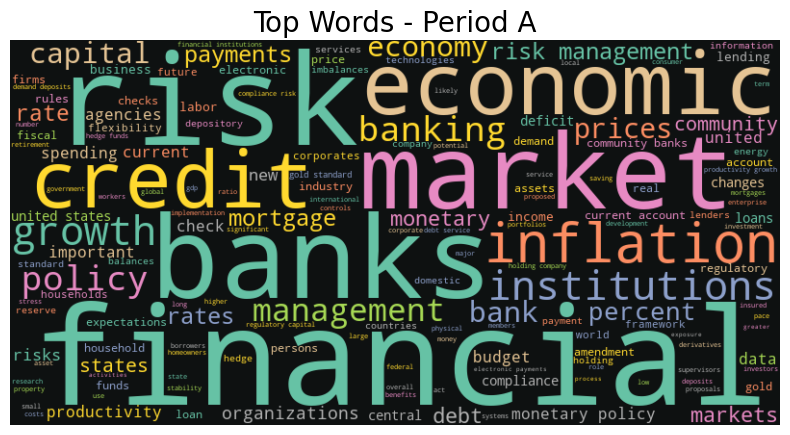

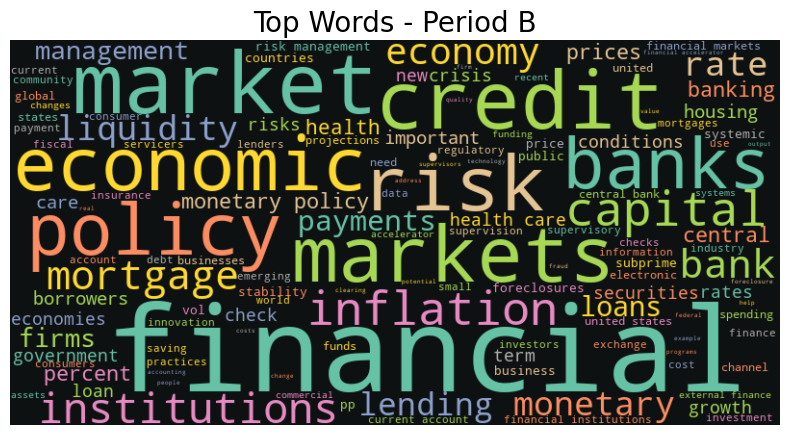

In [180]:
representation = "Top_Words_TFIDF" # "Top_Words" or "Top_Words_TFIDF"


combined_representation_A = cluster_info_A[representation].values.tolist()
combined_representation_A = combine_word_representation_from_cluster(combined_representation_A)

combined_representation_B = cluster_info_B[representation].values.tolist()
combined_representation_B = combine_word_representation_from_cluster(combined_representation_B)

plot_wordcloud(combined_representation_A, "Top Words - Period A", "wordcloud_period_A_speeches")
plot_wordcloud(combined_representation_B, "Top Words - Period B", "wordcloud_period_B_speeches")

##### 1.5 Compute and plot centroid drifts from A -> B

In [79]:
get_x = lambda x: np.nan if not isinstance(x, (list, tuple, np.ndarray)) or len(x) < 1 else x[0]
get_y = lambda x: np.nan if not isinstance(x, (list, tuple, np.ndarray)) or len(x) < 2 else x[1]

In [ ]:
# fig = go.Figure()

# fig.add_trace(
#     go.Scatter(
#         x=embeddings_A_2D[:, 0],
#         y=embeddings_A_2D[:, 1],
#         mode='markers',
#         name='Period A - Doc. Embeddings',
#         marker=dict(size=5, color=period_A["cluster"], colorscale="Ice"),
#         text=period_A['cluster'],
#         customdata=["A"] * len(embeddings_A_2D),
#         hovertemplate="Period A - Cluster %{text}<extra></extra>",
#     )
# )

# fig.add_trace(
#     go.Scatter(
#         x=embeddings_B_2D[:, 0],
#         y=embeddings_B_2D[:, 1],
#         mode='markers',
#         name='Period B - Doc. Embeddings',
#         marker=dict(size=5, color=period_B["cluster"], colorscale="Solar"),
#         text=period_B['cluster'],
#         customdata=["B"] * len(embeddings_B_2D),
#         hovertemplate="Period B - Cluster %{text}<extra></extra>",
#     )
# )

# fig.add_trace(
#     go.Scatter(
#         x=cluster_info_A['2D_Centroid'].apply(get_x),
#         y=cluster_info_A['2D_Centroid'].apply(get_y),
#         mode='markers',
#         name='Period A - Topic Centroids',
#         marker=dict(size=12, color=cluster_info_A["Cluster"], colorscale="Ice"),
#         text=cluster_info_A['Cluster'],
#         customdata=["A"] * len(cluster_info_A),
#         hovertemplate="Period A - Cluster %{text}<extra></extra>",
#     )
# )

# fig.add_trace(
#     go.Scatter(
#         x=cluster_info_B['2D_Centroid'].apply(get_x),
#         y=cluster_info_B['2D_Centroid'].apply(get_y),
#         mode='markers',
#         name='Period B - Topic Centroids',
#         marker=dict(size=12, color=cluster_info_B["Cluster"], colorscale="Solar"),
#         text=cluster_info_B['Cluster'],
#         customdata=["B"] * len(cluster_info_B),
#         hovertemplate="Period B - Cluster %{text}<extra></extra>",
#     )
# )

# compute_on = "Centroid" # "Centroid" or "2D_Centroid"
# drifts = {}
# for idx, row in cluster_info_B.iterrows():
#     cluster_id = row['Cluster']
#     if cluster_id in cluster_info_A['Cluster'].values:
#         centroid_A = cluster_info_A[cluster_info_A['Cluster'] == cluster_id][compute_on].values[0]
#         centroid_B = row[compute_on]
#         drift = centroid_B - centroid_A
#         drifts[cluster_id] = centroid_B - centroid_A

#         centroid_A_2D = cluster_info_A[cluster_info_A['Cluster'] == cluster_id]["2D_Centroid"].values[0]
#         centroid_B_2D = row["2D_Centroid"]
#         fig.add_trace(
#             go.Scatter(
#                 x=[get_x(centroid_A_2D), get_x(centroid_B_2D)],
#                 y=[get_y(centroid_A_2D), get_y(centroid_B_2D)],
#                 mode='markers+lines',
#                 marker=dict(
#                     symbol="arrow",
#                     size=10,
#                     angleref="previous",
#                     color="red",
#                 ),
#                 text=f"Topic {cluster_id}",
#                 name=f'A -> B Drift for Topic {cluster_id}',
#                 showlegend=False,
#             )
#         )
#     else:
#         drifts[cluster_id] = np.nan

# fig.layout.update(
#     title="Topic Clusters and Document Embeddings",
#     showlegend=True,
#     legend=dict(font=dict(size=12), orientation="h", x=0, y=-0),
#     hovermode='closest',
#     margin=dict(l=0, r=0, t=30, b=0),
#     width=1000,
#     height=800,
# )

# fig.show()

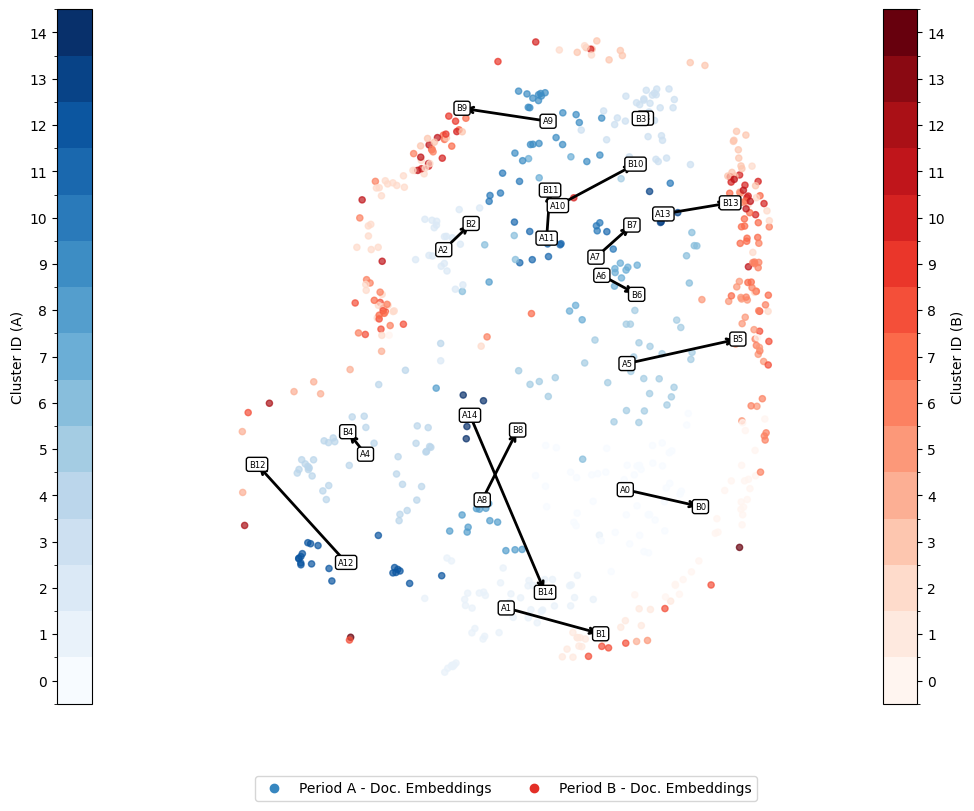

In [164]:
# fig, ax = plt.subplots(figsize=(10, 8))
fig, ax = plt.subplots(figsize=(10, 8), layout="constrained")

# a_color = "Blues"
# b_color = "Reds"
nb_clusters_A = len(cluster_info_A["Cluster"])
nb_clusters_B = len(cluster_info_B["Cluster"])
a_color = mpl.colormaps['Blues'].resampled(nb_clusters_A) #cm.get_cmap('Blues', nb_clusters_A)
b_color = mpl.colormaps['Reds'].resampled(nb_clusters_B) #cm.get_cmap('Reds', nb_clusters_B)
norm_A = mcolors.BoundaryNorm(boundaries=np.arange(nb_clusters_A + 1) - 0.5, ncolors=nb_clusters_A)
norm_B = mcolors.BoundaryNorm(boundaries=np.arange(nb_clusters_B + 1) - 0.5, ncolors=nb_clusters_B)

# --- Plot document embeddings ---
# Period A
scatter_A = ax.scatter(
    period_A["2D_embeddings"].apply(get_x),
    period_A["2D_embeddings"].apply(get_y),
    c=period_A["cluster"],
    cmap=a_color,
    s=20,
    label="Period A - Doc. Embeddings",
    alpha=0.7
)

# Period B
scatter_B = ax.scatter(
    period_B["2D_embeddings"].apply(get_x),
    period_B["2D_embeddings"].apply(get_y),
    c=period_B["cluster"],
    cmap=b_color,
    s=20,
    label="Period B - Doc. Embeddings",
    alpha=0.7
)

# # --- Plot centroids ---
# # Period A
# centroids_A_x = cluster_info_A["2D_Centroid"].apply(get_x)
# centroids_A_y = cluster_info_A["2D_Centroid"].apply(get_y)
# centroids_A_colors = cluster_info_A["Cluster"]
# ax.scatter(centroids_A_x, centroids_A_y, c="blue", s=100, marker="*", label="Period A - Topic Centroids")
# # ax.scatter(centroids_A_x, centroids_A_y, c=cluster_info_A["Cluster"], cmap=a_color, s=100, marker="*", label="Period A - Topic Centroids")

# # Period B
# centroids_B_x = cluster_info_B["2D_Centroid"].apply(get_x)
# centroids_B_y = cluster_info_B["2D_Centroid"].apply(get_y)
# centroids_B_colors = cluster_info_B["Cluster"]
# ax.scatter(centroids_B_x, centroids_B_y, c="red", s=100, marker="*", label="Period B - Topic Centroids")
# # ax.scatter(centroids_B_x, centroids_B_y, c=cluster_info_B["Cluster"], cmap=b_color, s=100, marker="*", label="Period B - Topic Centroids")

# --- Plot drift arrows ---
compute_on = "2D_Centroid"
drifts = {}
for idx, row in cluster_info_B.iterrows():
    cluster_id = row['Cluster']
    if cluster_id in cluster_info_A['Cluster'].values:
        centroid_A_2D = cluster_info_A[cluster_info_A['Cluster'] == cluster_id]["2D_Centroid"].values[0]
        centroid_B_2D = row["2D_Centroid"]

        start_x, start_y = get_x(centroid_A_2D), get_y(centroid_A_2D)
        end_x, end_y = get_x(centroid_B_2D), get_y(centroid_B_2D)

        ax.annotate(
            "",
            xy=(end_x, end_y),
            xytext=(start_x, start_y),
            arrowprops=dict(arrowstyle="->", color="black", lw=2),
        )

        drifts[cluster_id] = np.array(centroid_B_2D) - np.array(centroid_A_2D)
    else:
        drifts[cluster_id] = np.nan

# --- Add text labels for clusters ---
for idx, row in cluster_info_A.iterrows():
    cluster_id = row['Cluster']
    centroid_A_2D = cluster_info_A[cluster_info_A['Cluster'] == cluster_id]["2D_Centroid"].values[0]
    centroid_B_2D = cluster_info_B[cluster_info_B['Cluster'] == cluster_id]["2D_Centroid"].values[0]
    start_x, start_y = get_x(centroid_A_2D), get_y(centroid_A_2D)
    end_x, end_y = get_x(centroid_B_2D), get_y(centroid_B_2D)
    ax.text(
        start_x, start_y, # Start point
        # (start_x + end_x) / 2, (start_y + end_y) / 2, # Middle point
        # end_x, end_y, # End point
        f"A{cluster_id}", fontsize=6, ha="center", va="center", color="black",
        bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"),
    )
    ax.text(
        # start_x, start_y, # Start point
        # (start_x + end_x) / 2, (start_y + end_y) / 2, # Middle point
        end_x, end_y, # End point
        f"B{cluster_id}", fontsize=6, ha="center", va="center", color="black",
        bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"),
    )

# --- Add color bar ---
cbar_A = fig.colorbar(
    ScalarMappable(norm=norm_A, cmap=a_color), ax=ax, orientation="vertical", location="left", pad=0.15, ticks=np.arange(nb_clusters_A)
)
cbar_A.set_label("Cluster ID (A)", fontsize=10)
cbar_B = fig.colorbar(
    ScalarMappable(norm=norm_B, cmap=b_color), ax=ax, orientation="vertical", location="right", pad=0.15, ticks=np.arange(nb_clusters_B)
)
cbar_B.set_label("Cluster ID (B)", fontsize=10)

# --- Final styling ---
legend_dot_A = mlines.Line2D([], [], color='#3787c0', marker='o', linestyle='None', markersize=6, label='Period A - Doc. Embeddings')
legend_dot_B = mlines.Line2D([], [], color='#e32f27', marker='o', linestyle='None', markersize=6, label='Period B - Doc. Embeddings')
ax.legend(handles=[legend_dot_A, legend_dot_B], loc="lower center", bbox_to_anchor=(0.5, -0.15), ncol=2)
ax.set_xticks([]); ax.set_yticks([])
ax.set_frame_on(False)
# plt.tight_layout()

# ax.set_rasterized(True)
plt.savefig("images/topic_embedding_drift_speeches_plot.pdf", format="pdf", bbox_inches='tight')
# plt.close(fig)

plt.show()
# plt.draw()

##### 1.6 Unit drifts clustering

In [ ]:
drifts_df = pd.DataFrame.from_dict(drifts, orient='index', columns=['x', 'y']).dropna()
# drifts_df = pd.DataFrame.from_dict(drifts, orient='index').dropna()
drifts_df.index.name = "Cluster"

# Normalize drift vectors to unit length
unit_drifts = normalize(drifts_df.dropna().values, norm='l2')

k = 4
# # KMeans on unit vectors ≈ angular k-means (cosine similarity)
# kmeans = KMeans(n_clusters=k, random_state=RANDOM_STATE)
# drifts_df["labels"] = kmeans.fit_predict(unit_drifts)

# Compute angles in radians
angles = np.arctan2(unit_drifts[:, 1], unit_drifts[:, 0])   # range [-pi, pi]
angles = (angles + 2 * np.pi) % (2 * np.pi)                 # convert to [0, 2pi]
sector_size = 2 * np.pi / k                                 # Define number of angular sectors
labels = np.floor(angles / sector_size).astype(int)         # Assign each angle to a sector
drifts_df["labels"] = labels

# cosine_dist = cosine(unit_drifts)
# print(cosine_dist)

# fig = go.Figure()
# colors = ['red', 'blue', 'green', 'orange', 'purple', 'pink', 'brown', 'gray']
# for topic_id, row in drifts_df.iterrows():
#     x, y = unit_drifts[int(row.name)]
#     # x, y row['x'], row['y']
#     fig.add_trace(
#         go.Scatter(
#             x=[0, x],
#             y=[0, y],
#             mode='lines+text',
#             marker=dict(size=5, color=colors[int(row['labels'])]),
#             line=dict(width=2, color=colors[int(row['labels'])]),
#             text=f"Topic {topic_id}",
#             name=f"Drift Vector for Topic {topic_id}",
#             showlegend=True,
#         )
#     )
# fig.show()

In [148]:
drifts_df

,x,y,labels
Cluster,,,
0,0.621583,-0.187979,3
1,0.781036,-0.285414,3
2,0.226354,0.289222,0
3,-0.041313,-0.004177,2
4,-0.147341,0.248661,1
5,0.917040,0.270523,0
6,0.287983,-0.210077,3
7,0.297348,0.354790,0
8,0.292984,0.771241,0


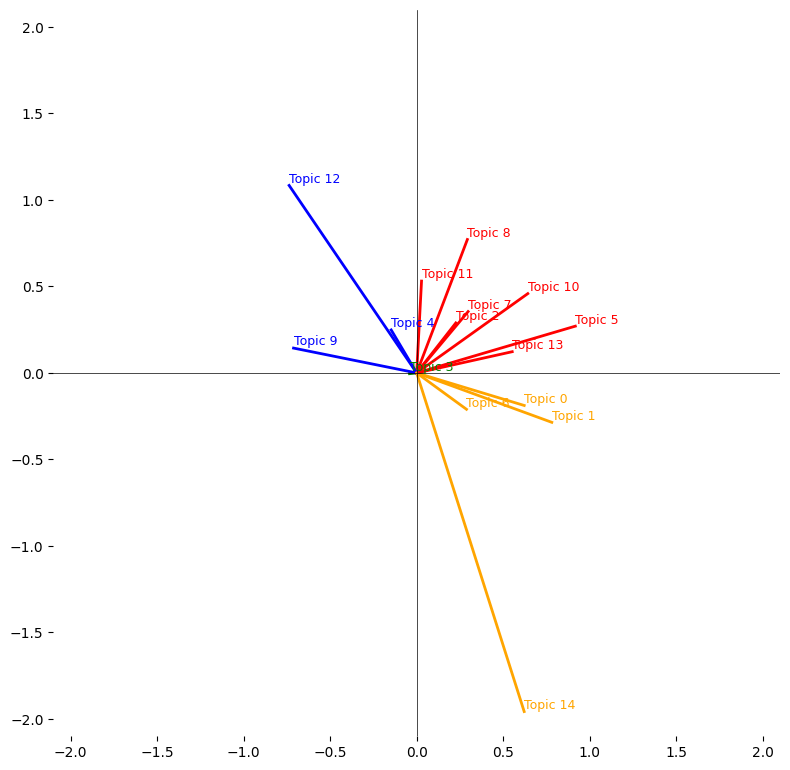

In [161]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'pink', 'brown', 'gray']

fig, ax = plt.subplots(figsize=(8, 10))

for topic_id, row in drifts_df.iterrows():
    # x, y = unit_drifts[int(row.name)]
    # label_id = int(row['labels'])
    x, y, label_id = row['x'], row['y'], int(row['labels'])
    color = colors[label_id]
    ax.plot([0, x], [0, y], color=color, linewidth=2, label=f"Topic {topic_id}")
    ax.text(x, y, f"Topic {topic_id}", fontsize=9, color=color, ha='left', va='bottom')

# lim = drifts_df[['x', 'y']].abs().max().max() 
# label_positions = [[lim,lim], [-lim, lim], [-lim, -lim], [lim, -lim]]
# for label in np.unique(labels):
#     x = label_positions[label][0]
#     y = label_positions[label][1]
#     ax.text(x, y,
#         f"Cluster {label}", fontsize=10, color=colors[label], ha='center', va='center',
#         bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white")
#     )

lim = 2.1
ax.set_aspect('equal', 'box')
ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)
ax.axhline(0, color='black', linewidth=0.5); ax.axvline(0, color='black', linewidth=0.5)
# ax.set_xlabel("Drift X"); ax.set_ylabel("Drift Y")
# ax.set_title("Unit Drift Vectors by Topic")
# ax.legend(loc="best", fontsize=8)
# ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.15), ncol=4, fontsize=8)
# ax.set_xticks([]); ax.set_yticks([])
ax.set_frame_on(False)
fig.tight_layout()

fig.savefig("images/unit_drift_vectors_speeches.pdf", format="pdf", bbox_inches="tight")
plt.show()

##### 1.7.1 Interpretation per cluster of drift

In [91]:
for cluster_id in range(k):
    cluster_topics = drifts_df[drifts_df['labels'] == cluster_id].index.tolist()
    temp_cluster_info_A = cluster_info_A[cluster_info_A['Cluster'].isin(cluster_topics)]
    temp_cluster_info_B = cluster_info_B[cluster_info_B['Cluster'].isin(cluster_topics)]

    # Get the most frequent words in the cluster
    topic_representation = "Top_Words"
    words_A = list(chain(*temp_cluster_info_A[topic_representation]))
    words_B = list(chain(*temp_cluster_info_B[topic_representation]))
    common_words = list(set(words_A) & set(words_B))
    new_words = list(set(words_B) - set(words_A))
    print(f"{len(new_words)} new words in unit drift cluster {cluster_id} (from {len(words_A)} words)")
    print(f"Common words: {common_words}")
    print(f"Words added by B: {new_words}")
    print()

16 new words in unit drift cluster 0 (from 50 words)
Common words: ['electronic', 'checks', 'payment', 'check', 'mortgage', 'markets', 'new', 'market', 'banks', 'capital', 'liquidity', 'payments', 'loan', 'economy', 'economic', 'monetary', 'credit', 'institutions', 'important', 'financial', 'policy', 'risk', 'lending']
Words added by B: ['securities', 'central', 'subprime', 'investors', 'firms', 'industry', 'inflation', 'high', 'consumers', 'consumer', 'use', 'innovation', 'education', 'loans', 'funds', 'borrowers']

5 new words in unit drift cluster 1 (from 20 words)
Common words: ['institutions', 'capital', 'financial', 'banks', 'business', 'banking', 'risks', 'risk', 'bank', 'risk management', 'management']
Words added by B: ['firms', 'liquidity', 'supervisory', 'information', 'market']

4 new words in unit drift cluster 2 (from 40 words)
Common words: ['monetary', 'institutions', 'central', 'financial', 'policy', 'inflation', 'monetary policy', 'growth', 'economic', 'prices', 'bank

##### 1.7.2 Interpretation per topic cluster

In [92]:
for cluster_id in cluster_info_A["Cluster"]:
    row_A = cluster_info_A[cluster_info_A["Cluster"] == cluster_id].iloc[0]
    row_B = cluster_info_B[cluster_info_B["Cluster"] == cluster_id].iloc[0]

    representation = "Top_Words_TFIDF" # "Top_Words"
    words_A = row_A[representation]
    words_B = row_B[representation]
    common_words = list(set(words_A) & set(words_B))
    print(f"Cluster {cluster_id}:")
    print("Common words:", common_words)
    print("Exclusive A words:", list(set(words_A) - set(common_words)))
    print("Exclusive B words:", list(set(words_B) - set(common_words)))
    print()

Cluster 0:
Common words: ['monetary', 'central', 'financial', 'policy', 'inflation', 'monetary policy', 'stability', 'market', 'prices', 'bank', 'economic', 'economy', 'price', 'real']
Exclusive A words: ['asset', 'important', 'changes', 'growth', 'expectations', 'low']
Exclusive B words: ['output', 'rates', 'risk', 'vol', 'rate', 'pp']

Cluster 1:
Common words: ['percent', 'policy', 'inflation', 'rates', 'growth', 'prices', 'rate', 'economic', 'economy', 'market', 'term']
Exclusive A words: ['demand', 'costs', 'spending', 'energy', 'likely', 'pace', 'price', 'labor', 'real']
Exclusive B words: ['monetary', 'housing', 'credit', 'financial', 'recent', 'mortgage', 'markets', 'lending', 'conditions']

Cluster 2:
Common words: ['institutions', 'credit', 'important', 'capital', 'financial', 'firms', 'financial institutions', 'risk', 'markets', 'market', 'banks']
Exclusive A words: ['stress', 'changes', 'exposure', 'greater', 'major', 'risk management', 'potential', 'overall', 'management']


In [93]:
cluster_id = 0
row_A = cluster_info_A[cluster_info_A["Cluster"] == cluster_id].iloc[0]
row_B = cluster_info_B[cluster_info_B["Cluster"] == cluster_id].iloc[0]

representation = "Top_Words_TFIDF" # "Top_Words"
words_A = row_A[representation]
words_B = row_B[representation]
common_words = list(set(words_A) & set(words_B))
print(f"Cluster {cluster_id}:")
print("Common words:", common_words)
print("Exclusive A words:", list(set(words_A) - set(common_words)))
print("Exclusive B words:", list(set(words_B) - set(common_words)))
print()

Cluster 0:
Common words: ['monetary', 'central', 'financial', 'policy', 'inflation', 'monetary policy', 'stability', 'market', 'prices', 'bank', 'economic', 'economy', 'price', 'real']
Exclusive A words: ['asset', 'important', 'changes', 'growth', 'expectations', 'low']
Exclusive B words: ['output', 'rates', 'risk', 'vol', 'rate', 'pp']



In [94]:
row_A.Top_Representative_Docs

['Remarks by Mr PERSON, PERSON, Vice Chairman of ORGANIZATION of ORGANIZATION, at the Conference on ORGANIZATION, ORGANIZATION, and ORGANIZATION, ORGANIZATION of Atlanta, Georgia, DATE.    I am very pleased to open this conference on ORGANIZATION, ORGANIZATION and ORGANIZATION. Let me begin by thanking the ORGANIZATION of Atlanta for hosting this conference and for organizing, along with ORGANIZATION, an impressive program that is filled with high-quality papers on topics of keen interest to central bankers. Before proceeding, I must indicate that the views I am about to express are my own and do not necessarily reflect the views of other members of ORGANIZATION or ORGANIZATION more generally. Few subjects are more important for central bankers than the efficiency and stability of our financial system. The term "financial instability" is often poorly defined. Some argue that financial instability occurs when imperfections or externalities in the financial system are substantial enough 

In [95]:
row_B.Top_Representative_Docs

['PERSON: Monetary policy research and the financial crisis - strengths and shortcomings ORGANIZATION by Mr PERSON, Vice Chairman of ORGANIZATION of ORGANIZATION, at ORGANIZATION in Monetary Policy, Washington DC, DATE. The original speech, which contains various links to the documents mentioned, can be found on ORGANIZATION\'s website.    PERSON of Monetary Economics The first two volumes of the were published in DATE.NUM It is fitting that ORGANIZATION should hold a conference showcasing the chapters of the third volume of the PERSON. Since DATE, there has been a sharp increase in the degree of interaction between academic economists and central bank economists in the field of monetary analysis. The beginnings of this trend were evident in the author list of volume one of the PERSON, which featured two chapters coauthored by economists ORGANIZATION and PERSON, who went on to have long careers at ORGANIZATION.NUM It is reflected today in the planned contents for volume three, which fe